# House Price Analysis

This notebook is an attempt to implement solutions to a Kaggle competition Data Science/Analysis problem ([House Prices - Advanced Regression Techniques](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/data))

## 1. Problem Definition and Dataset Overview

- **Goal**: The goal is to predict the final price of residential homes in Ames, Iowa using various explanatory variables that describe aspects of the houses.

- **Data**: The data is based on real apartments sales data collected for 1 decade.

- **Input**: 

    - The dataset is split into two files:
        - `train.csv` – includes **1460 rows** and **81 columns**, including the target variable `SalePrice`.
        - `test.csv` – includes **1459 rows** and **80 features**, excluding the target.

    - Each row represents a single residential property.
    - The data includes both **numerical** (e.g., `GrLivArea`, `TotalBsmtSF`) and **categorical** (e.g., `Neighborhood`, `ExterQual`) features.
    - A detailed description of each feature is available in the **`data_description.txt`** file.

- **Output**: The outcome of this effort is expected to be an acceptable model for prediction of residential homes.

- **Acceptance Criteria**: success metrics: How will we measure the success of our predictions? (e.g., mean squared error (MSE), mean absolute error (MAE), or R-squared (R²)). 


### Workflow (Table of Content)

The approach is to move toward the solution in different phases considering the given data, the requirements, the expectations, and the natural order of activities in such a project.

The following list contains an ordered sketch of what is going to be carried out.

The list is composed in HTML for better readability and providing a cleaner appearance.

In [130]:
from IPython.display import HTML # For HTML use

HTML("""
<style>
  table.clean {
    border-collapse: collapse;
    width: 100%;
    font-family: sans-serif;
    margin-bottom: 2em;
  }
  table.clean th {
    text-align: left;
    padding: 8px;
    border-bottom: 2px solid black;
  }
  table.clean td {
    text-align: left;
    padding: 8px;
    border-bottom: 1px solid lightgray;
  }
  table.clean tr:last-child td {
    border-bottom: none;
  }
  .phase-title {
    font-weight: bold;
    font-size: 1.1em;
    margin: 1.5em 0 0.5em;
  }
</style>

<div class="phase-title">Phase 1: Problem Definition and Data Collection</div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>1</td><td>Define Business Objectives</td><td>Clarify the problem, project goals, Key Performance Indicators (KPIs), and success criteria.</td></tr>
  <tr><td>2</td><td>Define Data Strategy</td><td>Identify and gather data from sources like APIs, databases, or public datasets.</td></tr>
</table>

<div class="phase-title">Phase 2: Ingestion & Assessment </div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>3</td><td>Initial File Verification</td>
      <td>Check if the dataset files exist, are accessible, and in the correct format (e.g., CSV, Excel). Confirm correct encoding and delimiter.</td></tr>
  <tr><td>4</td><td>Module and Data Load</td>
      <td>Import necessary libraries (e.g., pandas, numpy) and load the data into memory for exploration.</td></tr>
  <tr><td>3</td><td>Initial Exploration and Assessment</td>
      <td>Use methods like <code>df.info()</code>, <code>df.describe()</code>, and <code>df.head()</code> to assess structure, data types, and basic statistics.</td></tr>
</table>

<div class="phase-title">Phase 3: Initial Cleaning </div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>3</td><td>Handling Duplicates</td>
      <td>Identify and remove duplicate rows using <code>df.duplicated()</code> and <code>df.drop_duplicates()</code> to ensure data integrity.</td></tr>
  <tr><td>4</td><td>Inconsistent Formatting</td>
      <td>Detect and fix formatting issues like inconsistent casing, extra spaces, or mixed data types in categorical fields.</td></tr>
  <tr><td>5</td><td>Data Corruption or Abnormal Values</td>
      <td>Look for corrupted, nonsensical, or extreme outlier values that may indicate data entry issues or sensor errors. Use domain knowledge or statistical thresholds to flag and address them.</td></tr>
</table>
     
<div class="phase-title">Phase 4: Exploratory Data Analysis (EDA) </div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>5</td><td>Initial EDA</td><td>Plot histograms, boxplots, and use summary stats. Use scatterplots and correlation matrices to identify relationships.</td></tr>
  <tr><td>6</td><td>Analyze Target Variable</td><td>Examine the distribution of the target variable (<code>y</code>). Check for class imbalance, skew, and outliers.</td></tr>
  <tr><td>7</td><td>Identify Potential Outliers</td><td>Use visualizations (histograms, boxplots) and statistical methods (Z-scores, Isolation Forest) to detect potential outliers. Do not remove or modify them yet.</td></tr>
</table>
     
<div class="phase-title">Phase 5: Data Splitting</div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>8</td><td>Split Data</td><td>Divide the dataset into training, validation, and test sets. A common split is 80%/10%/10%.</td></tr>
  <tr><td>9</td><td>Save the Test Set</td><td>Store the test set separately and do not use it for any purpose until the final model evaluation to prevent data leakage.</td></tr>
</table>

<div class="phase-title">Phase 6: Preprocessing (Train/Validation Data Only)</div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>10a</td><td>Handle Outliers</td><td>On training data only: Remove outliers using methods like IQR or Z-score. Transform skewed data using log, square root, or Box-Cox transformations.</td></tr>
  <tr><td>10b</td><td>Handle Missing Values</td><td>Impute missing values using techniques like mean/median for numerical data or mode for categorical data.</td></tr>
  <tr><td>10c</td><td>Encode Categorical Variables</td><td>Apply one-hot encoding for nominal features, label encoding for ordinal features, and other techniques for high-cardinality features.</td></tr>
  <tr><td>10d</td><td>Process Text Features</td><td>Clean, tokenize, and vectorize text using methods like TF-IDF or word embeddings.</td></tr>
  <tr><td>10e</td><td>Feature Scaling</td><td>Fit the scaler on the training data only, then transform both the training and validation sets using methods like StandardScaler or MinMaxScaler.</td></tr>
</table>

<div class="phase-title">Phase 7: Feature Engineering</div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>11</td><td>Create New Features</td><td>Derive new features (e.g., polynomial, interaction) from existing ones.</td></tr>
</table>

<div class="phase-title">Phase 8: Feature Selection and Dimensionality Reduction</div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>12</td><td>Feature Selection</td><td>Select the most relevant features using techniques like Lasso regularization, Recursive Feature Elimination (RFE), or feature importance scores.</td></tr>
  <tr><td>13</td><td>Dimensionality Reduction</td><td>Apply PCA, t-SNE, or other techniques if needed to reduce feature space for high-dimensional data.</td></tr>
</table>

<div class="phase-title">Phase 9: Modeling and Evaluation (Train/Validation Data Only)</div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>14</td><td>Modeling</td><td>Train multiple candidate models on the prepared training data.</td></tr>
  <tr><td>15</td><td>Cross-Validation</td><td>Use K-Fold cross-validation on the training data to get a robust estimate of model performance.</td></tr>
  <tr><td>16</td><td>Hyperparameter Tuning</td><td>Use techniques like GridSearchCV or RandomizedSearchCV to optimize model hyperparameters within the training data.</td></tr>
  <tr><td>17</td><td>Validation Evaluation</td><td>Evaluate the tuned models on the validation set using chosen metrics (e.g., RMSE, MAE, R²).</td></tr>
</table>

<div class="phase-title">Phase 10: Final Evaluation and Deployment</div>
<table class="clean">
  <tr><th>Step</th><th>Action</th><th>Notes</th></tr>
  <tr><td>18</td><td>Final Prediction</td><td>Apply the entire trained pipeline to the completely unseen test set. Never refit or reprocess the test data.</td></tr>
  <tr><td>19</td><td>Final Evaluation</td><td>Evaluate the final model on the test set using the same metrics. Report performance.</td></tr>
  <tr><td>20</td><td>Interpretation</td><td>Explain model predictions using tools like SHAP or feature importance plots.</td></tr>
  <tr><td>21</td><td>Deployment Preparation</td><td>Save the final model and the complete preprocessing pipeline.</td></tr>
  <tr><td>22</td><td>Monitoring</td><td>Plan for monitoring the model's performance and data/concept drift in production. Define retraining triggers.</td></tr>
</table>
""")


Step,Action,Notes
1,Define Business Objectives,"Clarify the problem, project goals, Key Performance Indicators (KPIs), and success criteria."
2,Define Data Strategy,"Identify and gather data from sources like APIs, databases, or public datasets."
Step,Action,Notes
3,Initial File Verification,"Check if the dataset files exist, are accessible, and in the correct format (e.g., CSV, Excel). Confirm correct encoding and delimiter."
4,Module and Data Load,"Import necessary libraries (e.g., pandas, numpy) and load the data into memory for exploration."
3,Initial Exploration and Assessment,"Use methods like df.info(), df.describe(), and df.head() to assess structure, data types, and basic statistics."
Step,Action,Notes
3,Handling Duplicates,Identify and remove duplicate rows using df.duplicated() and df.drop_duplicates() to ensure data integrity.
4,Inconsistent Formatting,"Detect and fix formatting issues like inconsistent casing, extra spaces, or mixed data types in categorical fields."
5,Data Corruption or Abnormal Values,"Look for corrupted, nonsensical, or extreme outlier values that may indicate data entry issues or sensor errors. Use domain knowledge or statistical thresholds to flag and address them."


## 2. Ingestion (Module and Data Load)

### Modules

In [131]:
import os
import numpy as np 
import pandas as pd 
import sklearn as sk
import seaborn as sns  # Visualization
import matplotlib.pyplot as plt  # Visualization
import networkx as nx  # Visualization
import matplotlib.patches as mpatches   # Visualization
from sklearn.model_selection import train_test_split  # Train and test data splitting
import math # For skew calculations
from scipy.stats import skew, kurtosis  # For skew calculations
import warnings
from sklearn.preprocessing import StandardScaler  # Scaling
from scipy.stats import pearsonr, spearmanr  # For significance test
from scipy.stats import f_oneway  # For significance test
from sklearn.linear_model import LinearRegression # For modeling (LinReg)
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score # For modeling/testing evaluation
from sklearn.ensemble import RandomForestRegressor  # For modeling/testing (RanFor)
from sklearn.dummy import DummyRegressor # For modeling/testing

### Initial setup

In [132]:
# To temporarily suppress the some warnings faced in plotting
warnings.filterwarnings("ignore") 

### File verification

In [133]:
for directory_name, _, file_names in os.walk('./input'): 
    for file_name in file_names: 
        print(os.path.join(directory_name, file_name))

expected_files = {'train.csv', 'test.csv'}
actual_files = set(os.listdir('./input'))

missing = expected_files - actual_files
if not missing:
    print ("\n\n Success checking the files: train/test files are in place.")
if missing:
    raise FileNotFoundError(f"Missing files: {missing}")


./input\data_description.txt
./input\sample_submission.csv
./input\test.csv
./input\train.csv


 Success checking the files: train/test files are in place.


### Loading the dataset

In [134]:
df = pd.read_csv("./input/train.csv")
df_test = pd.read_csv("./input/test.csv")

In [135]:
df_original = df.copy()

### Initial assessment and exploring the dataset

In [136]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [137]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [138]:
print(df.columns)

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

## 3. Initial Data Cleaning and Modification

### Inconsistent Formatting

In [139]:
# Identify categorical (object or category dtype) columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns

print("Checking unique values in categorical columns (excluding NaNs):\n")

for col in categorical_cols:
    unique_vals = df[col].dropna().unique()

    print(f"Column: '{col}'")
    print(f"Unique non-null values ({len(unique_vals)}): {unique_vals}\n")

Checking unique values in categorical columns (excluding NaNs):

Column: 'MSZoning'
Unique non-null values (5): ['RL' 'RM' 'C (all)' 'FV' 'RH']

Column: 'Street'
Unique non-null values (2): ['Pave' 'Grvl']

Column: 'Alley'
Unique non-null values (2): ['Grvl' 'Pave']

Column: 'LotShape'
Unique non-null values (4): ['Reg' 'IR1' 'IR2' 'IR3']

Column: 'LandContour'
Unique non-null values (4): ['Lvl' 'Bnk' 'Low' 'HLS']

Column: 'Utilities'
Unique non-null values (2): ['AllPub' 'NoSeWa']

Column: 'LotConfig'
Unique non-null values (5): ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']

Column: 'LandSlope'
Unique non-null values (3): ['Gtl' 'Mod' 'Sev']

Column: 'Neighborhood'
Unique non-null values (25): ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']

Column: 'Condition1'
Unique non-null values (9): ['No

### Inconsistent types in one column

In [140]:

print("Mixed Type Check (excluding NaNs):\n")

for col in categorical_cols:
    type_counts = df[col].dropna().apply(type).value_counts()
    status = "⚠️ Mixed types" if len(type_counts) > 1 else "✅ Consistent type"
    type_list = ', '.join([t.__name__ for t in type_counts.index])
    print(f"{col}: {status} → [{type_list}]")


Mixed Type Check (excluding NaNs):

MSZoning: ✅ Consistent type → [str]
Street: ✅ Consistent type → [str]
Alley: ✅ Consistent type → [str]
LotShape: ✅ Consistent type → [str]
LandContour: ✅ Consistent type → [str]
Utilities: ✅ Consistent type → [str]
LotConfig: ✅ Consistent type → [str]
LandSlope: ✅ Consistent type → [str]
Neighborhood: ✅ Consistent type → [str]
Condition1: ✅ Consistent type → [str]
Condition2: ✅ Consistent type → [str]
BldgType: ✅ Consistent type → [str]
HouseStyle: ✅ Consistent type → [str]
RoofStyle: ✅ Consistent type → [str]
RoofMatl: ✅ Consistent type → [str]
Exterior1st: ✅ Consistent type → [str]
Exterior2nd: ✅ Consistent type → [str]
MasVnrType: ✅ Consistent type → [str]
ExterQual: ✅ Consistent type → [str]
ExterCond: ✅ Consistent type → [str]
Foundation: ✅ Consistent type → [str]
BsmtQual: ✅ Consistent type → [str]
BsmtCond: ✅ Consistent type → [str]
BsmtExposure: ✅ Consistent type → [str]
BsmtFinType1: ✅ Consistent type → [str]
BsmtFinType2: ✅ Consistent type 

### Checking Duplicates

In [141]:
# Check for duplicate rows
duplicates = df.duplicated()  # 'duplicates' is a boolean series

# Show all duplicate rows
df_duplicates = df[duplicates]

# Print number of duplicates
print(f"Number of duplicate rows: {df_duplicates.shape[0]}")
print(df_duplicates)

Number of duplicate rows: 0
Empty DataFrame
Columns: [Id, MSSubClass, MSZoning, LotFrontage, LotArea, Street, Alley, LotShape, LandContour, Utilities, LotConfig, LandSlope, Neighborhood, Condition1, Condition2, BldgType, HouseStyle, OverallQual, OverallCond, YearBuilt, YearRemodAdd, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, MasVnrArea, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinSF1, BsmtFinType2, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, Heating, HeatingQC, CentralAir, Electrical, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, KitchenQual, TotRmsAbvGrd, Functional, Fireplaces, FireplaceQu, GarageType, GarageYrBlt, GarageFinish, GarageCars, GarageArea, GarageQual, GarageCond, PavedDrive, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, PoolQC, Fence, MiscFeature, MiscVal, MoSold, YrSold, SaleType, SaleCondition, SalePrice]
Index: []


### Feature Type Classification

In statistics we have the following scales for metrics (semantic types):
- **Ordinal**: Ordered categories (e.g., quality ratings)
- **Nominal**: Unordered categories (e.g., neighborhood names)
- **Numeric**: Continuous numeric features (further divides into interval and ratio scales. e.g., number of card in garage, or sale price)

We also identify features that are stored as numbers but represent categorical information.
We also identify features that are not stored as number but represent numeric information.

<br><br>

Hence, The features may be categorized under 6 different groups:

1. **Numeric that is represented as numbers** -> leave as is
2. **Numeric that is not represented as numbers** (non-existent in this problem) -> perform encoding
3. **Ordinal that is represented as numbers** -> make sure if the numerical representation is meaningful
4. **Ordinal that is not represented as numbers** -> perform encoding (Phase/Section 6)
5. **Nominal that is represented as numbers** -> depending on the feature, either perform one-hot encoding or leave as is
6. **Nominal that is not represented as numbers** -> perform one-hot encoding (Phase/Section 6) 


#### 1. Numerical (Interval or Ratio) — Represented as Numbers

> True numerical variables with appropriate numeric representation (float or int)

##### Interval (no true zero) — Discrete:
- YearBuilt
- YearRemodAdd
- GarageYrBlt
- YrSold
- MoSold  *(arguable: could also be treated as nominal for modeling seasonality)*

##### Interval (no true zero) — Discrete:
- none

##### Ratio (has true zero) — Discrete:
- GarageCars
- BedroomAbvGr
- KitchenAbvGr
- TotRmsAbvGrd
- BsmtFullBath
- BsmtHalfBath
- FullBath
- HalfBath
- Fireplaces

##### Ratio (has true zero) — Continuous:
- LotFrontage
- LotArea
- MasVnrArea
- BsmtFinSF1
- BsmtFinSF2
- BsmtUnfSF
- TotalBsmtSF
- 1stFlrSF
- 2ndFlrSF
- LowQualFinSF
- GrLivArea
- GarageArea
- WoodDeckSF
- OpenPorchSF
- EnclosedPorch
- 3SsnPorch
- ScreenPorch
- PoolArea
- MiscVal
- SalePrice *(Target variable — ratio)*



#### 2. Numerical (Interval or Ratio) — Represented as Numbers

> no feature exist in this group in this problem

#### 3. Ordinal — Represented as Numbers

> Ordered categories, but encoded with integers. Models may misinterpret them as numeric.

- OverallQual
- OverallCond
- MSSubClass

#### 4. Ordinal — Represented as Strings

> Ordered categories, stored as strings. Should be ordinal-encoded for models.

- ExterQual
- ExterCond
- BsmtQual
- BsmtCond
- HeatingQC
- KitchenQual
- FireplaceQu
- GarageQual
- GarageCond
- PoolQC
- Fence
- BsmtExposure
- BsmtFinType1
- BsmtFinType2
- GarageFinish
- PavedDrive
- LotShape
- LandSlope
- Functional


#### 5. Nominal — Represented as Numbers

> Categories without order, but encoded as integers. Must be one-hot encoded or converted to strings.

- MSSubClass
- MoSold *(if treated as label instead of time feature)*


#### 6. Nominal — Represented as Strings 

> Unordered categorical variables with correct string/object representation

- MSZoning
- Street
- Alley
- LandContour
- Utilities
- LotConfig
- Neighborhood
- Condition1
- Condition2
- BldgType
- HouseStyle
- RoofStyle
- RoofMatl
- Exterior1st
- Exterior2nd
- MasVnrType
- Foundation
- Heating
- CentralAir
- Electrical
- GarageType
- MiscFeature
- SaleType
- SaleCondition

<br>

The following are Numeric-looking, but not statistically numeric (False Numerics), i.e. Features that are **represented using numbers**, but are **not** numerical in scale. 


- MSSubClass (ordinal, encoded numerically)
- OverallQual (ordinal, not numeric)
- OverallCond (ordinal, not numeric)
- MoSold (month ≠ interval)

These belong to categories 3 and 5, but are called out here for clarity.

<br>

**Sometimes the same variable can have different data types** : Please note that a variable like **year** or **month** can be interpreted as **nominal**, **ordinal**, or **numerical**, depending on the context and the kind of analysis being performed.

<br>
For instance, **Year** can be interpreted/expected/used in any of the following forms.

| Type      | Use Case                                                                 | Reasoning                                                                 |
|-----------|--------------------------------------------------------------------------|---------------------------------------------------------------------------|
| Nominal   | Campaign IDs for marketing (e.g. 2022, 2023, 2024)                        | Years are just labels, not used in any order or calculation               |
| Nominal   | Grouping by eras (e.g. 1980s, 1990s)                                       | Treated as discrete categories, not continuous values                     |
| Ordinal   | Ranking team performance over seasons                                     | Ordered, but intervals between years aren't assumed equal                 |
| Ordinal   | Academic levels by entry year                                             | Sequence matters, but numeric operations are irrelevant                   |
| Interval  | Calculating investment duration (e.g. 2020 → 2025 = 5 years)              | Consistent intervals, no true zero                                        |
| Interval  | Modeling with year in time-series forecasting                            | Mathematical operations on years are valid                                |

<br><br>


<!-- 
Month

| Type      | Use Case                                                                 | Reasoning                                                                 |
|-----------|--------------------------------------------------------------------------|---------------------------------------------------------------------------|
| Nominal   | Comparing sales in July vs December                                      | Months are categories with no implied order                               |
| Nominal   | Survey response: “In which month did you purchase?”                     | Treated as labels                                                         |
| Ordinal   | Analyzing seasonal trends across the year                               | Order matters, but months are not truly numeric                           |
| Ordinal   | Rainfall rankings from Jan to Dec                                        | Chronological order is used                                               |
| Ratio     | Calculating delay between order and delivery (March - Jan = 2 months)    | Can perform arithmetic; 0 = reference point                              |
| Cyclical  | Sine/cosine encoding for seasonality in models                           | Month is treated numerically for modeling seasonal cycles                 |


----------------------------------------------------------------------------------------------------- 
Year

Nominal
To differentiate unique campaigns: A marketing department runs a different campaign each year and wants to compare their effectiveness. The years 2022, 2023, and 2024 are treated as distinct categories, not ordered or measured numerically.
To classify by era: A historian groups historical data into eras, such as The 1980s and The 1990s. The years serve as labels for different cultural or economic periods.
To categorize birth years: A sociologist studying generational trends might use birth years like 1995 or 2005 to place individuals into distinct generational categories, such as "Gen Z." The numbers function as categorical labels rather than a numeric measurement.


Ordinal
To track performance over time: A manager looks at a company's sales data from 2020 to 2024. The order is important for identifying if sales are increasing or decreasing, but the difference between 2020 and 2021 is not necessarily the same as the difference between 2023 and 2024.
To rank sports seasons: A sports analyst ranks the performance of a team over several seasons, from the 2018 season to the 2023 season. The order of the seasons is significant for understanding the team's trajectory.
To denote a school year: A school system categorizes students by their school year, such as first-year and third-year students. The numeric value represents a rank in a sequence, not a measurable quantity.


Numeric
To calculate elapsed time: A financial analyst calculates the time elapsed between 2015 and 2025 to determine the growth of an investment. The years are treated as interval data, where the difference between 2015 and 2016 is the same as the difference between 2024 and 2025.
To project future trends: A data scientist uses a numeric year variable to model time-series data and project future sales figures. The year's value is used in mathematical calculations to represent time.
To convert to another unit: A programmer extracts the year as an integer from a date (2025) to use in calculations, such as determining a person's age.


Month

Nominal:
To group sales data by season: A retail store compares the sales performance of different months, such as December and July, to understand seasonal buying habits. The months are treated as distinct, unordered labels.
To categorize based on an event: A biologist compares breeding patterns during different months of the year (May, June, July). The focus is on the category of the month rather than its position in the calendar.
To analyze survey data: A researcher asks, "In which month did you purchase our product?" The months (January, February, etc.) are treated as distinct categories, and the order is not relevant to the analysis.

Ordinal:
To identify seasonal trends: An air quality researcher analyzes pollution levels month by month, observing a general increase from January to August and a decrease afterward. The ordering of the months is crucial for this type of seasonal trend analysis.
To categorize data for an annual cycle: A meteorologist ranks average rainfall for each month of the year to show which months are the wettest and driest. The ordered sequence of months (from 1st to 12th) provides meaningful insight.
To follow a chronological process: A project manager tracks progress on a timeline, marking the completion of milestones in the first, second, and third months. The months are ranked in a sequence to show project progression.

Numeric:
To calculate time differences: A logistics analyst computes the time difference between the month of an order (month=1 for January) and the month of delivery (month=3 for March). The numeric values can be subtracted to calculate the duration.
To use in statistical modeling: A data scientist uses the month as a cyclic variable in a machine learning model to capture seasonality. They may use sine and cosine transformations of the month's numeric value to represent its cyclical nature effectively.
To extract a feature from a timestamp: A programmer extracts the numeric month (e.g., 5 for May) from a date field to perform calculations or to create a new variable. -->


### Categorical and Numerical features

In [142]:
# Separate features by dtype
object_cols = df.select_dtypes(include='object').columns.tolist()
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Count unique values for categoricals
unique_counts = df[object_cols].nunique()
print ("\n\n List of features (represented with object type) and the number of unique values under each feature: \n\n", unique_counts, "\n\n")

# Count unique values for numeric vars (categorical/nominal/numerical vars in form of numerics)
unique_counts = df[numeric_cols].nunique()
print ("\n\n List of features (represented with a number type) and the number of unique values under each feature: \n\n", unique_counts, "\n\n")





 List of features (represented with object type) and the number of unique values under each feature: 

 MSZoning          5
Street            2
Alley             2
LotShape          4
LandContour       4
Utilities         2
LotConfig         5
LandSlope         3
Neighborhood     25
Condition1        9
Condition2        8
BldgType          5
HouseStyle        8
RoofStyle         6
RoofMatl          8
Exterior1st      15
Exterior2nd      16
MasVnrType        3
ExterQual         4
ExterCond         5
Foundation        6
BsmtQual          4
BsmtCond          4
BsmtExposure      4
BsmtFinType1      6
BsmtFinType2      6
Heating           6
HeatingQC         5
CentralAir        2
Electrical        5
KitchenQual       4
Functional        7
FireplaceQu       5
GarageType        6
GarageFinish      3
GarageQual        5
GarageCond        5
PavedDrive        3
PoolQC            3
Fence             4
MiscFeature       4
SaleType          9
SaleCondition     6
dtype: int64 




 List of feature

In [143]:

# Ordinal features
ordinal_feat = [
    'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC', 'KitchenQual',
    'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'BsmtExposure', 
    'BsmtFinType1', 'BsmtFinType2', 'GarageFinish', 'PavedDrive', 'LotShape', 'LandSlope', 'Functional',
    'OverallQual', 'OverallCond'  # these two are represented by numbers
]


# Numeric discrete features: those discrete features that have low cardinality (small number of unique values). 
# These will be excluded when doing outlier detection and removal
numeric_discrete = ["YearBuilt", "YearRemodAdd", "GarageYrBlt", "YrSold", "MoSold", "GarageCars",
                                    "Bedroom", "TotRmsAbvGrd", "BsmtFullBath", "BsmtHalfBath",
                                    "HalfBath", "Fireplaces", "KitchenAbvGr", "BedroomAbvGr", "FullBath"]


# Nominal features
nominal_feat = list(set(object_cols) - set(ordinal_feat))
nominal_feat.extend(['MSSubClass'])  # it is additionally inserted among nominals since it is initially represented by numbers
# 'YearBuilt', 'YrSold', 'MoSold' : these three can be considered nominal or numeric depending on context, expectation and other factors (here we consider them numeric)


def print_feature_group(title, features, indent="  ", items_per_line=8):
    print(title)
    for i in range(0, len(features), items_per_line):
        chunk = features[i:i + items_per_line]
        line = indent + "  ".join(f"{feat}" for feat in chunk)
        print(line)

# Categorical features
print("\nCategorical features:\n")
print_feature_group("  a) Ordinal (ordered):", ordinal_feat, indent="     ")
print()
print_feature_group("  b) Nominal (unordered):", nominal_feat, indent="     ")

# Numeric features (excluding overlap)
numeric_feat = list(set(numeric_cols) - set(ordinal_feat) - set(nominal_feat))
print_feature_group("\nNumeric features:\n", sorted(numeric_feat), indent="  ")

print ("\n-------------------------------------------------------------------")

print("\nThere are three types of features that are represented by numbers (ordinal, nominal, and numerical):")

numeric_ordinals = list(set(ordinal_feat) - set(object_cols))
print("\nOrdinal features that are represented by numbers, not strings:")
print(numeric_ordinals)

numeric_nominals = list(set(nominal_feat) - set(object_cols))
print("\nNominal features that are represented by numbers, not strings:")
print(numeric_nominals)

numeric_numericals = numeric_feat # list(set(numeric_cols) - set(ordinal_feat) - set(nominal_feat))
print("\nNumeric features:")
print(numeric_numericals)

# print (len(numeric_cols)+len(object_cols), len(df.columns.tolist()))




Categorical features:

  a) Ordinal (ordered):
     ExterQual  ExterCond  BsmtQual  BsmtCond  HeatingQC  KitchenQual  FireplaceQu  GarageQual
     GarageCond  PoolQC  Fence  BsmtExposure  BsmtFinType1  BsmtFinType2  GarageFinish  PavedDrive
     LotShape  LandSlope  Functional  OverallQual  OverallCond

  b) Nominal (unordered):
     MiscFeature  Exterior1st  SaleCondition  SaleType  MSZoning  Utilities  HouseStyle  Electrical
     Alley  Condition1  Street  Foundation  Neighborhood  RoofMatl  BldgType  LotConfig
     Condition2  RoofStyle  LandContour  Heating  MasVnrType  CentralAir  GarageType  Exterior2nd
     MSSubClass

Numeric features:

  1stFlrSF  2ndFlrSF  3SsnPorch  BedroomAbvGr  BsmtFinSF1  BsmtFinSF2  BsmtFullBath  BsmtHalfBath
  BsmtUnfSF  EnclosedPorch  Fireplaces  FullBath  GarageArea  GarageCars  GarageYrBlt  GrLivArea
  HalfBath  Id  KitchenAbvGr  LotArea  LotFrontage  LowQualFinSF  MasVnrArea  MiscVal
  MoSold  OpenPorchSF  PoolArea  SalePrice  ScreenPorch  TotRmsAb

## 4. Exploratory Data Analysis (EDA)

We already started with dataset overview and analysis in previous steps, here we will continue and focus with more detail on the feature values, distributions, and relations with target variable.

In [165]:
print("Shape:", df.shape)
print("\nData Types:\n\n", df.dtypes.value_counts())

Shape: (1460, 81)

Data Types:

 object     43
int64      35
float64     3
Name: count, dtype: int64


### Descriptive Stats Info

#### a. Numeric features

In [173]:

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print("\n Basic Description of Numeric Features:\n")
    print(df[numeric_feat].describe(include='all').T)


 Basic Description of Numeric Features:

                count           mean           std      min        25%  \
GrLivArea      1460.0    1515.463699    525.480383    334.0    1129.50   
BsmtFinSF1     1460.0     443.639726    456.098091      0.0       0.00   
LotFrontage    1201.0      70.049958     24.284752     21.0      59.00   
KitchenAbvGr   1460.0       1.046575      0.220338      0.0       1.00   
TotRmsAbvGrd   1460.0       6.517808      1.625393      2.0       5.00   
PoolArea       1460.0       2.758904     40.177307      0.0       0.00   
TotalBsmtSF    1460.0    1057.429452    438.705324      0.0     795.75   
LowQualFinSF   1460.0       5.844521     48.623081      0.0       0.00   
ScreenPorch    1460.0      15.060959     55.757415      0.0       0.00   
LotArea        1460.0   10516.828082   9981.264932   1300.0    7553.50   
2ndFlrSF       1460.0     346.992466    436.528436      0.0       0.00   
3SsnPorch      1460.0       3.409589     29.317331      0.0       0.00

#### b. Ordinal features

In [174]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print("\n Basic Description of Ordinal Features:\n")
    print(df[ordinal_feat].describe(include='all').T)


 Basic Description of Ordinal Features:

               count unique    top  freq      mean       std  min  25%  50%  \
ExterQual       1460      4     TA   906       NaN       NaN  NaN  NaN  NaN   
ExterCond       1460      5     TA  1282       NaN       NaN  NaN  NaN  NaN   
BsmtQual        1423      4     TA   649       NaN       NaN  NaN  NaN  NaN   
BsmtCond        1423      4     TA  1311       NaN       NaN  NaN  NaN  NaN   
HeatingQC       1460      5     Ex   741       NaN       NaN  NaN  NaN  NaN   
KitchenQual     1460      4     TA   735       NaN       NaN  NaN  NaN  NaN   
FireplaceQu      770      5     Gd   380       NaN       NaN  NaN  NaN  NaN   
GarageQual      1379      5     TA  1311       NaN       NaN  NaN  NaN  NaN   
GarageCond      1379      5     TA  1326       NaN       NaN  NaN  NaN  NaN   
PoolQC             7      3     Gd     3       NaN       NaN  NaN  NaN  NaN   
Fence            281      4  MnPrv   157       NaN       NaN  NaN  NaN  NaN   
BsmtExposu

#### c. Nominal features

In [175]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print("\n Basic Description of Nominal Features:\n")
    print(df[nominal_feat].describe(include='all').T)


 Basic Description of Nominal Features:

                count unique      top  freq      mean        std   min   25%  \
MiscFeature        54      4     Shed    49       NaN        NaN   NaN   NaN   
Exterior1st      1460     15  VinylSd   515       NaN        NaN   NaN   NaN   
SaleCondition    1460      6   Normal  1198       NaN        NaN   NaN   NaN   
SaleType         1460      9       WD  1267       NaN        NaN   NaN   NaN   
MSZoning         1460      5       RL  1151       NaN        NaN   NaN   NaN   
Utilities        1460      2   AllPub  1459       NaN        NaN   NaN   NaN   
HouseStyle       1460      8   1Story   726       NaN        NaN   NaN   NaN   
Electrical       1459      5    SBrkr  1334       NaN        NaN   NaN   NaN   
Alley              91      2     Grvl    50       NaN        NaN   NaN   NaN   
Condition1       1460      9     Norm  1260       NaN        NaN   NaN   NaN   
Street           1460      2     Pave  1454       NaN        NaN   NaN   NaN  

### Distribution and Histograms

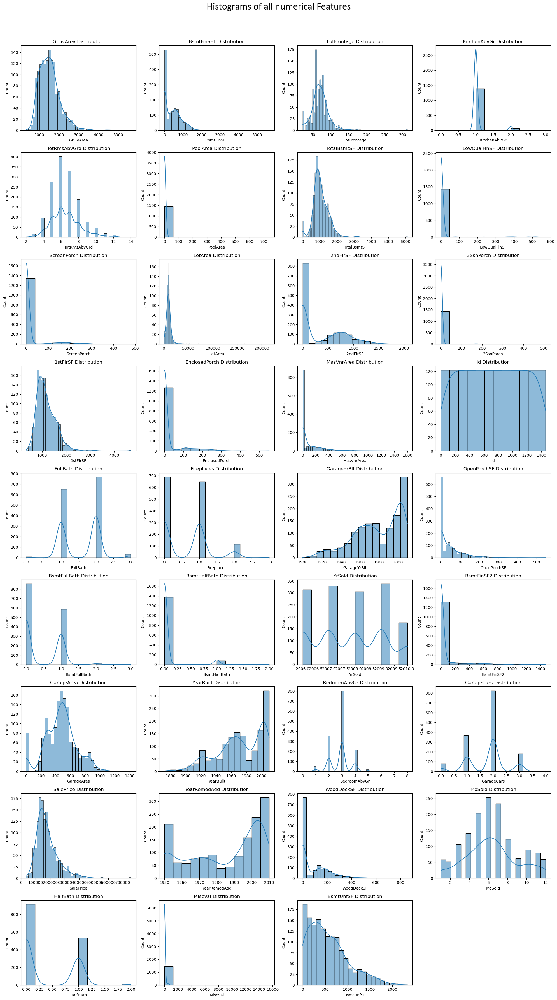

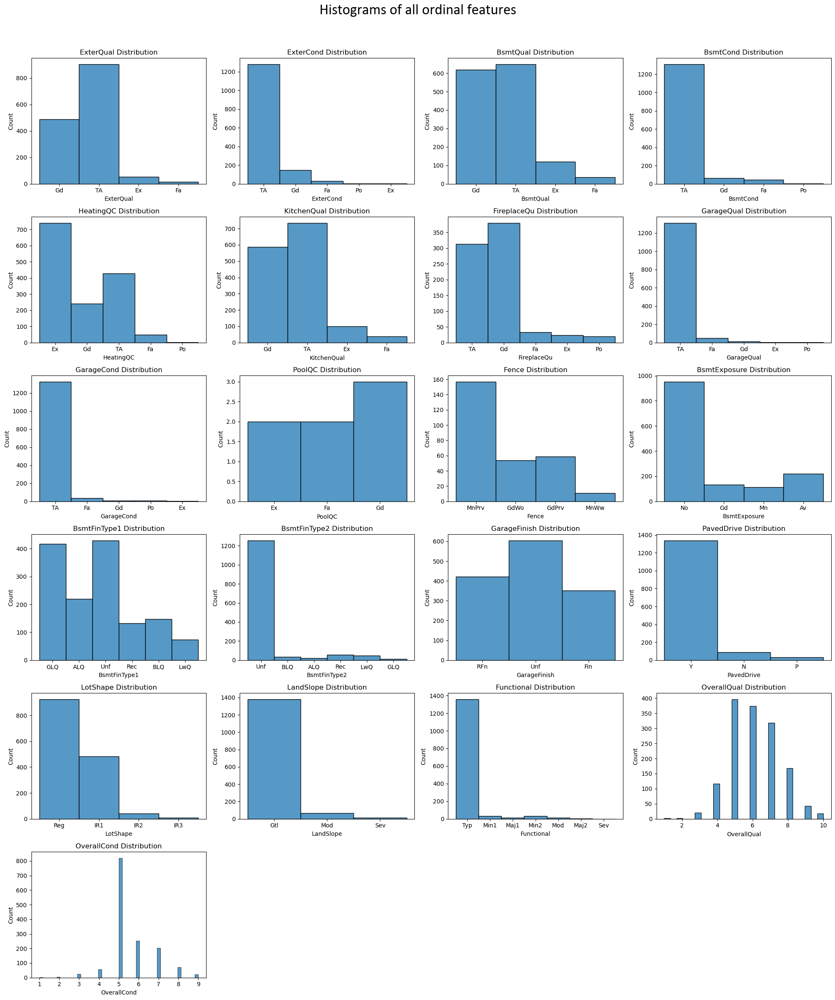

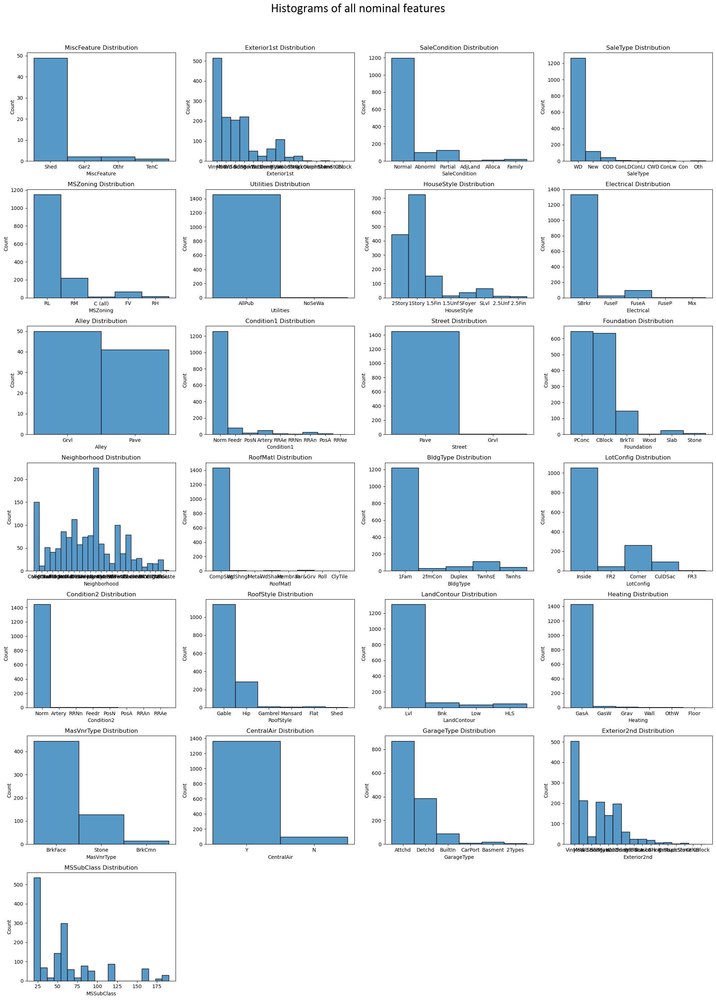

In [172]:

cols = 4
total = len(numeric_feat)
rows = math.ceil(total / cols)

plt.figure(figsize=(5 * cols, 4 * rows))

# 🔹 Add super title BEFORE plotting to avoid overlap
plt.suptitle("Histograms of all numerical Features",
             fontsize=25,             # font size
            #  fontweight='bold',       # optional: make it bold
             fontname='Calibri',  # or any available font
             y=0.99)                  # adjust vertical position (1.0 = top)

for i, feature in enumerate(numeric_feat, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(df[feature].dropna(), kde=True)
    plt.title(f"{feature} Distribution")
    plt.xlabel(feature)
    plt.ylabel("Count")

plt.tight_layout(rect=[0, 0, 1, 0.97])  # reserve space for suptitle
plt.show()



cols = 4
total = len(ordinal_feat)
rows = math.ceil(total / cols)

plt.figure(figsize=(5 * cols, 4 * rows))

#  Add super title BEFORE plotting to avoid overlap
plt.suptitle("Histograms of all ordinal features",
             fontsize=25,             # font size
            #  fontweight='bold',       # optional: make it bold
             fontname='Calibri',  # or any available font
             y=0.99)                  # adjust vertical position (1.0 = top)

for i, feature in enumerate(ordinal_feat, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(df[feature].dropna(), kde=False)
    plt.title(f"{feature} Distribution")
    plt.xlabel(feature)
    plt.ylabel("Count")

plt.tight_layout(rect=[0, 0, 1, 0.97])  # reserve space for suptitle
plt.show()


cols = 4
total = len(nominal_feat)
rows = math.ceil(total / cols)

plt.figure(figsize=(5 * cols, 4 * rows))

#  Add super title BEFORE plotting to avoid overlap
plt.suptitle("Histograms of all nominal features",
             fontsize=25,             # font size
            #  fontweight='bold',       # optional: make it bold
             fontname='Calibri',  # or any available font
             y=0.99)                  # adjust vertical position (1.0 = top)

for i, feature in enumerate(nominal_feat, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(df[feature].dropna(), kde=False)
    plt.title(f"{feature} Distribution")
    plt.xlabel(feature)
    plt.ylabel("Count")

plt.tight_layout(rect=[0, 0, 1, 0.97])  # reserve space for suptitle
plt.show()

### Target Analysis

#### a. Numeric features:

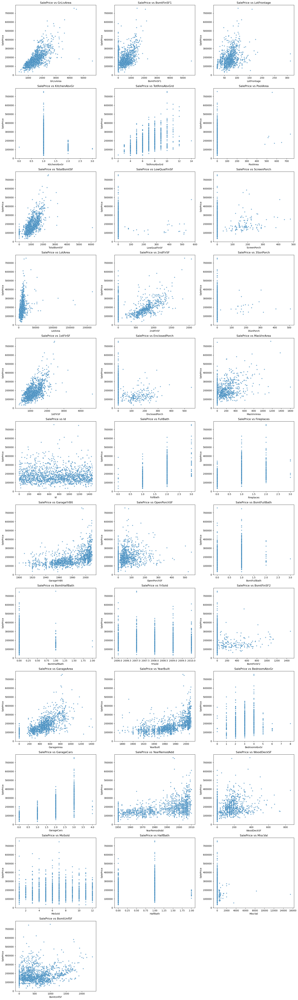

In [102]:
# Exclude target variable
numeric_feat_wo_target = [feature for feature in numeric_feat if feature != 'SalePrice']

# Plot settings
plots_per_row = 3
total_plots = len(numeric_feat_wo_target)
rows = (total_plots + plots_per_row - 1) // plots_per_row

plt.figure(figsize=(plots_per_row * 6, rows * 5))

for i, feature in enumerate(numeric_feat_wo_target, 1):
    plt.subplot(rows, plots_per_row, i)
    try:
        sns.scatterplot(data=df, x=feature, y='SalePrice', alpha=0.6, s=20)
        plt.title(f'SalePrice vs {feature}')
    except Exception as e:
        plt.text(0.5, 0.5, f"Error: {feature}", ha='center', va='center')
        print(f"Error plotting {feature}: {e}")

plt.tight_layout()
plt.show()

#### b. Ordinal features

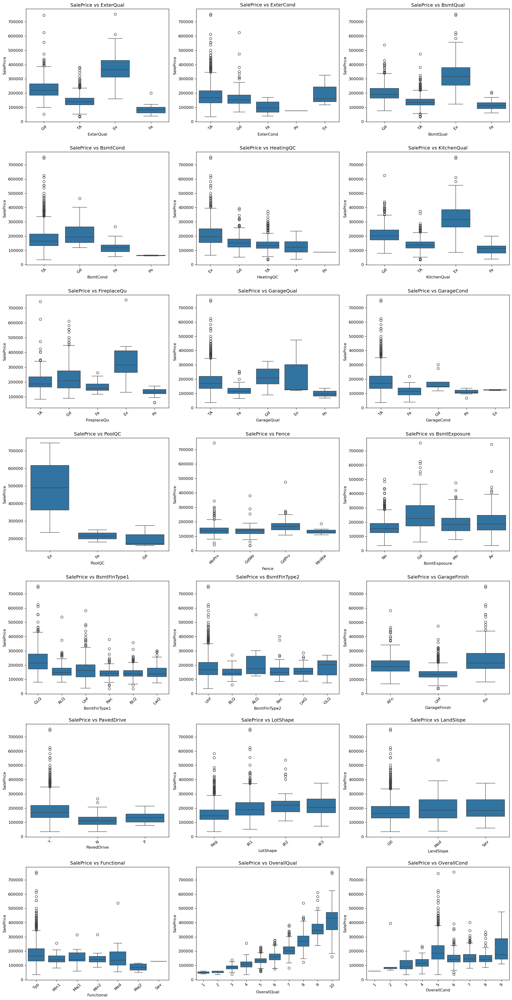

In [103]:
# Plot
plots_per_row = 3
total_plots = len(ordinal_feat)
rows = (total_plots + plots_per_row - 1) // plots_per_row

plt.figure(figsize=(plots_per_row * 6, rows * 5), dpi=120)

for i, feature in enumerate(ordinal_feat, 1):
    plt.subplot(rows, plots_per_row, i)
    try:
        sns.boxplot(x=feature, y='SalePrice', data=df)
        plt.title(f"SalePrice vs {feature}")
        plt.xticks(rotation=45)    
    except Exception as e:
        plt.text(0.5, 0.5, f"Error with {feature}", horizontalalignment='center', verticalalignment='center')
        # print(f"Error plotting {feature}: {e}")
        
plt.tight_layout()
plt.show()

In [185]:
# df["OverallCond"].value_counts()

df["OverallCond"].value_counts().sort_index()


OverallCond
1      1
2      5
3     25
4     57
5    821
6    252
7    205
8     72
9     22
Name: count, dtype: int64

#### c. Nominal features:

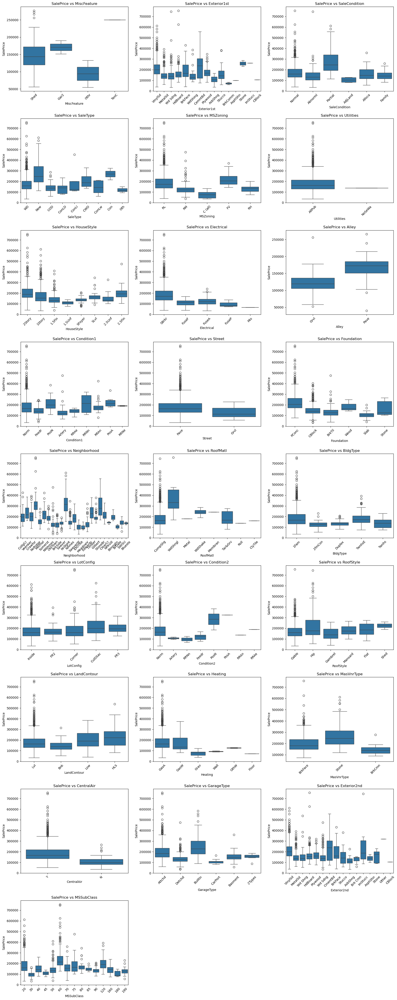

In [104]:
# Plotting
plots_per_row = 3
total_plots = len(nominal_feat)
rows = (total_plots + plots_per_row - 1) // plots_per_row

plt.figure(figsize=(plots_per_row * 6, rows * 5))

for i, feature in enumerate(nominal_feat, 1):
    plt.subplot(rows, plots_per_row, i)
    try:
        sns.boxplot(x=feature, y='SalePrice', data=df)
        plt.title(f"SalePrice vs {feature}")
        plt.xticks(rotation=45)
    except Exception as e:
        plt.text(0.5, 0.5, f"Error with {feature}", horizontalalignment='center', verticalalignment='center')
        print(f"Error plotting {feature}: {e}")

plt.tight_layout()
plt.show()


## 5. Test and Train split

In this step, test and train sets are split because in the following phase (Phase 6. Preprocessing) in some steps the transformations/cleaning task need to be applied only on the training set to prevent data leakage.

From this point 'df' is the dataframe for the training data, and 'df_test' contains split test data.

In [105]:
df_before_split = df.copy()

In [106]:
# Define target and feature columns
target = "SalePrice"
feature_columns = feature_columns = [col for col in df.columns if col != "SalePrice"]  ##['GrLivArea', 'GarageCars', 'TotalBsmtSF', 'OverallQual']

# Split into features (X) and target (y)
X = df[feature_columns]
y = df[target]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

df_train = pd.concat([X_train,y_train], axis=1)
df = df_train.copy()

df_test = pd.concat([X_test,y_test], axis=1)


In [107]:
print ("Total number of rows (test+train) after the split (it should be 1460): ", len(df_test)+len(df), 
       "\n Training datafram dimensions: " , df.shape, "\n Testing dataframe dimensions: ", df_test.shape)

Total number of rows (test+train) after the split (it should be 1460):  1460 
 Training datafram dimensions:  (1168, 81) 
 Testing dataframe dimensions:  (292, 81)


## 6. Preprocessing

### Outlier Detection and Removal

In [108]:

# # Plot the boxplot
# plt.figure(figsize=(8, 5))
# sns.boxplot(x='OverallQual', y='SalePrice', data=df)
# plt.title('SalePrice by Overall Quality')
# plt.show()

# # Outlier detection using IQR for each category of OverallQual
# outliers = pd.DataFrame()

# for qual in df['OverallQual'].unique():
#     group = df[df['OverallQual'] == qual]
#     Q1 = group['SalePrice'].quantile(0.25)
#     Q3 = group['SalePrice'].quantile(0.75)
#     IQR = Q3 - Q1
#     lower_bound = Q1 - 1.5 * IQR
#     upper_bound = Q3 + 1.5 * IQR

#     # Filter outliers
#     group_outliers = group[(group['SalePrice'] < lower_bound) | (group['SalePrice'] > upper_bound)]
    
#     outliers = pd.concat([outliers, group_outliers])

# # Show the outliers
# print("Number of outliers detected:", len(outliers))
# # display(outliers.head())



The method for identifying outliers in this problem is chosen to be (1.5 * IQR)

The **categorical features**, and **discrete numerical features which have low cardinality** (little amount of unique values) are excluded from outlier detection and removal process because of the nature of the data they hold. For instance, when only values 1,2,3,4,5, etc. are possible for a feature, and there are a small number of possible values, it is probable that many data points are identified as outlier (using 1.5 * IQR rule).

#### a. Outliers of numeric features 

One of the ways that help in investigating and reviewing if a data point is actually an outlier, is using the scatter plot of each numeric feature vs the target feature. It provides a fluent way to check if discrete variables are included or not, or maybe if there is some meaningful data that is being 

['GrLivArea', 'BsmtFinSF1', 'LotFrontage', 'PoolArea', 'TotalBsmtSF', 'LowQualFinSF', 'ScreenPorch', 'LotArea', '2ndFlrSF', '3SsnPorch', '1stFlrSF', 'EnclosedPorch', 'MasVnrArea', 'Id', 'OpenPorchSF', 'BsmtFinSF2', 'GarageArea', 'SalePrice', 'WoodDeckSF', 'MiscVal', 'BsmtUnfSF']


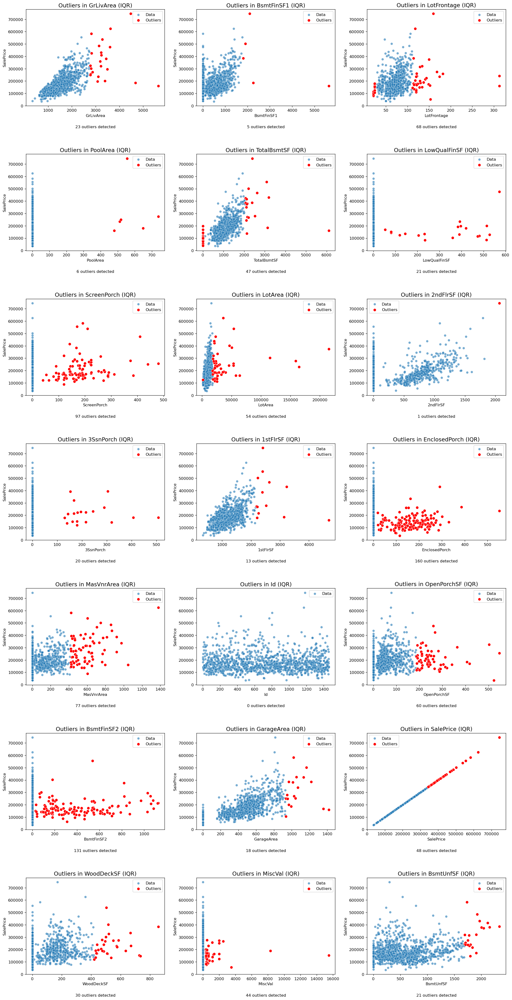

In [109]:
selected_numeric_features = list(set(numeric_feat) - set(numeric_discrete) - (set(nominal_feat)|set(ordinal_feat)))
print(selected_numeric_features)
all_outliers_numeric = pd.DataFrame()

plots_per_row = 3
title_fontsize = 14
dpi = 120

# Set up the overall figure size
n_features = len(selected_numeric_features)
n_rows = int(np.ceil(n_features / plots_per_row))

fig, axes = plt.subplots(n_rows, plots_per_row, figsize=(18, 5 * n_rows), dpi=dpi)
axes = axes.flatten()  # To iterate easily even if 1D

for idx, feature in enumerate(selected_numeric_features):
    ax = axes[idx]

    # Compute IQR bounds
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Find outliers
    outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)]
    all_outliers_numeric = pd.concat([all_outliers_numeric, outliers])

    # Plot
    sns.scatterplot(ax=ax, x=df[feature], y=df['SalePrice'], label='Data', alpha=0.6)
    sns.scatterplot(ax=ax, x=outliers[feature], y=outliers['SalePrice'], color='red', label='Outliers', s=50)

    ax.set_title(f"Outliers in {feature} (IQR)", fontsize=title_fontsize)
    ax.legend()

    # Annotate number of outliers below the plot
    ax.text(
        0.5, -0.2, f"{len(outliers)} outliers detected",
        fontsize=10, ha='center', va='top',
        transform=ax.transAxes
    )

# Hide any unused subplots
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
fig.subplots_adjust(hspace=0.5)
plt.show()


We may also plot the outliers of each feature separately, which has the same result as above but boxplot is chosen to investigate visually.

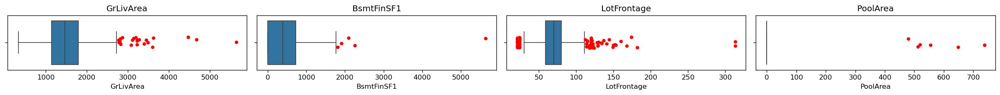

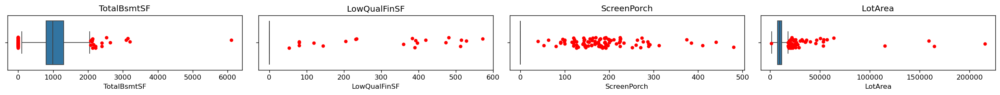

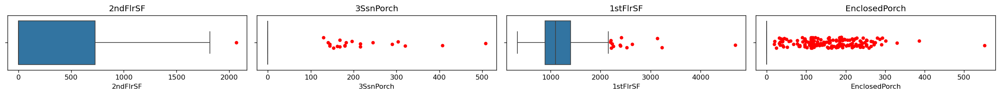

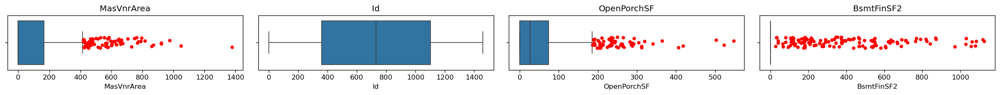

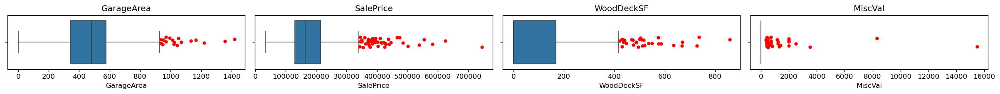

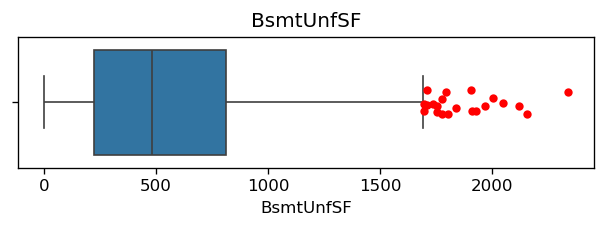

In [110]:
def detect_outliers_numeric(df, numeric_features, plot=False):
    all_outliers = {}
    
    for i, feature in enumerate(numeric_features):
        series = df[feature].dropna()
        Q1 = series.quantile(0.25)
        Q3 = series.quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        outlier_indices = df[(df[feature] < lower) | (df[feature] > upper)].index
        all_outliers[feature] = set(outlier_indices)

        if plot:
            # Start a new figure every 4 plots
            if i % 4 == 0:
                plt.figure(figsize=(20, 2), dpi=120)  

        if plot:
            plt.subplot(1, 4, (i % 4) + 1)
            sns.boxplot(x=df[feature], showfliers=False)
            sns.stripplot(x=df.loc[outlier_indices, feature], color='red', size=5)
            plt.title(f'{feature}')
            if (i + 1) % 4 == 0 or i == len(numeric_features) - 1:
                plt.tight_layout()
                plt.show()

    return all_outliers


def remove_all_outliers(df, outlier_dict):
    # Combine all outlier index sets
    all_indices = set()
    for indices in outlier_dict.values():
        all_indices.update(indices)

    print(f"Removing {len(all_indices)} total outlier rows.")
    df_cleaned = df.drop(index=all_indices)
    return df_cleaned

def detect_outliers_ordinal(df, ordinal_features, target='SalePrice', plot=False):
    all_outliers = {}
    num_features = len(ordinal_features)
    plots_per_row = 2
    num_rows = (num_features + plots_per_row - 1) // plots_per_row

    for i, feature in enumerate(ordinal_features):
        outlier_indices = set()
        for level in df[feature].dropna().unique():
            group = df[df[feature] == level]
            Q1 = group[target].quantile(0.25)
            Q3 = group[target].quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5 * IQR
            upper = Q3 + 1.5 * IQR

            outliers = group[(group[target] < lower) | (group[target] > upper)]
            outlier_indices.update(outliers.index)

        all_outliers[feature] = outlier_indices

    if plot:
        fig, axes = plt.subplots(nrows=num_rows, ncols=plots_per_row, figsize=(14, 5 * num_rows), dpi=120)
        axes = axes.flatten()

        for i, feature in enumerate(ordinal_features):
            outliers = list(all_outliers[feature])
            ax = axes[i]
            # Cast x to string for plotting
            sns.boxplot(x=df[feature].astype(str), y=df[target], ax=ax, showfliers=False)
            sns.stripplot(x=df.loc[outliers, feature].astype(str), 
                          y=df.loc[outliers, target], color='red', size=5, jitter=True, ax=ax)
            ax.set_title(f'{feature} vs {target} (Outliers in Red)')
            ax.set_xlabel(feature)

        plt.tight_layout()
        plt.show()

    return all_outliers

# Detect outliers
numeric_outliers = detect_outliers_numeric(df, selected_numeric_features, plot=True)
ordinal_outliers = detect_outliers_ordinal(df, ordinal_feat, plot=False)
nominal_outliers = detect_outliers_ordinal(df, nominal_feat, plot=False)

# Combine both
all_outliers_dict = {**numeric_outliers, **ordinal_outliers}



#### b. Outliers of numeric features divided by categorical subgroups

There is another method to investigate the outliers of numeric features that needs proper care and much consideration. It may be specially useful to remove outliers for the target feature.

This method works by detecting the outliers of a numeric variable (e.g. SalePrice) for each subcategory of a categorical variable. For instance for OverallQual = 1, SalePrice has a distribution and a specific boxplot, so outliers may be detected for 1, and then for 2, and so on.

Since this method has the risk of detecting a large number of false positives (meaningful data that is considered outlier), it is not used in this project, but two sample diagrams are plotted to show how it might help in a general workflow.

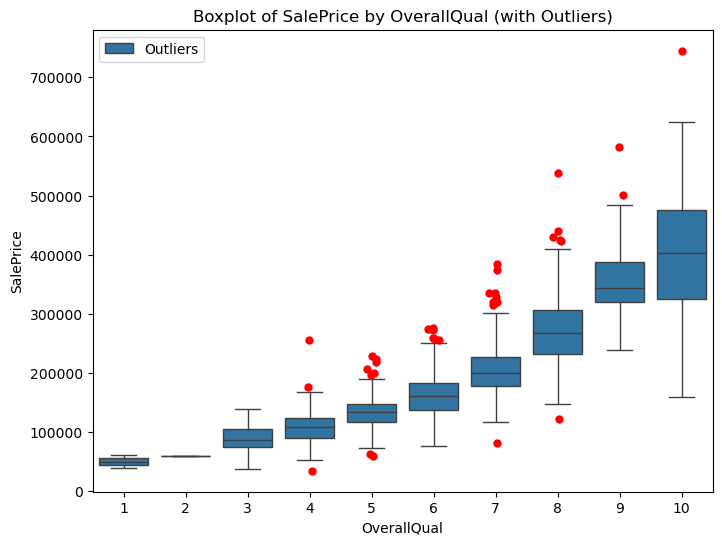

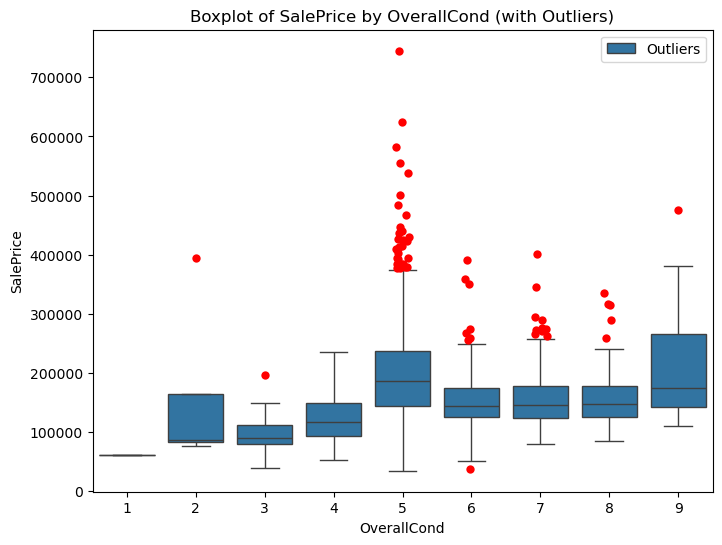

In [111]:
# Store all outliers
all_outliers = pd.DataFrame()

# selected_categorical_features = list (set(selected_features) & (set(numeric_ordinals)|set(numeric_nominals)) )

for feature in numeric_ordinals:
    # # Initialize plot
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=feature, y='SalePrice', data=df, showfliers=False)  # hide default fliers

    outliers = pd.DataFrame()
    all_outliers = pd.DataFrame()
    # all_outliers = []

    # Loop through each group in OverallQual
    for qual in sorted(df[feature].unique()):
        group = df[df[feature] == qual]
        
        # IQR Calculation
        Q1 = group['SalePrice'].quantile(0.25)
        Q3 = group['SalePrice'].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        # print ('IQR= ', IQR, 'Q1= ', Q1, 'Q3= ', Q3, 'lower= ',lower_bound, 'upper= ', upper_bound, 'qual=', qual, 'lb', Q1-1.5*IQR)
        
        # Get outliers
        outliers = group[(group['SalePrice'] < lower_bound) | (group['SalePrice'] > upper_bound)]
        all_outliers = pd.concat([all_outliers, outliers])
        
        # Print outliers for this group
        # print(f"\nOutliers for {feature} = {qual}:")
        # print(outliers[[feature, 'SalePrice']])
        
        # Plot the outliers manually
        sns.stripplot(x=outliers[feature], y=outliers['SalePrice'], 
                    color='red', size=6, jitter=True, label='Outliers')

    plt.title(f"Boxplot of SalePrice by {feature} (with Outliers)")
    plt.legend(['Outliers'])
    plt.show()

#### Deciding to remove the outliers

In [112]:
# Remove them without asking the user:
# df_cleaned = remove_all_outliers(df, all_outliers_dict)


# # Ask user if outliers should be removed:
# remove = input("Do you want to remove these numeric feature outliers from the dataset? (yes/no): ").strip().lower()

# if remove in ['yes', 'y']:
#     original_shape = df.shape
#     df = df.drop(all_outliers_numeric.index).drop_duplicates()
#     print(f"\nOutliers removed. Dataset reduced from {original_shape} to {df.shape}.")
# else:
#     print("\nOutliers NOT removed.")

### Skewness

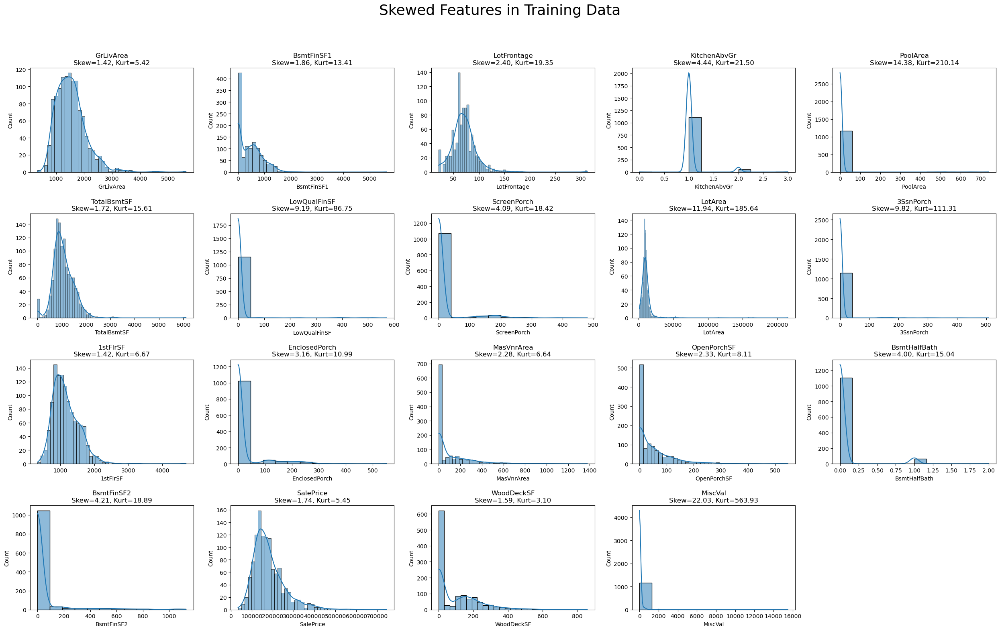

19 numeric features in Training dataset with skew > 1 are plotted.




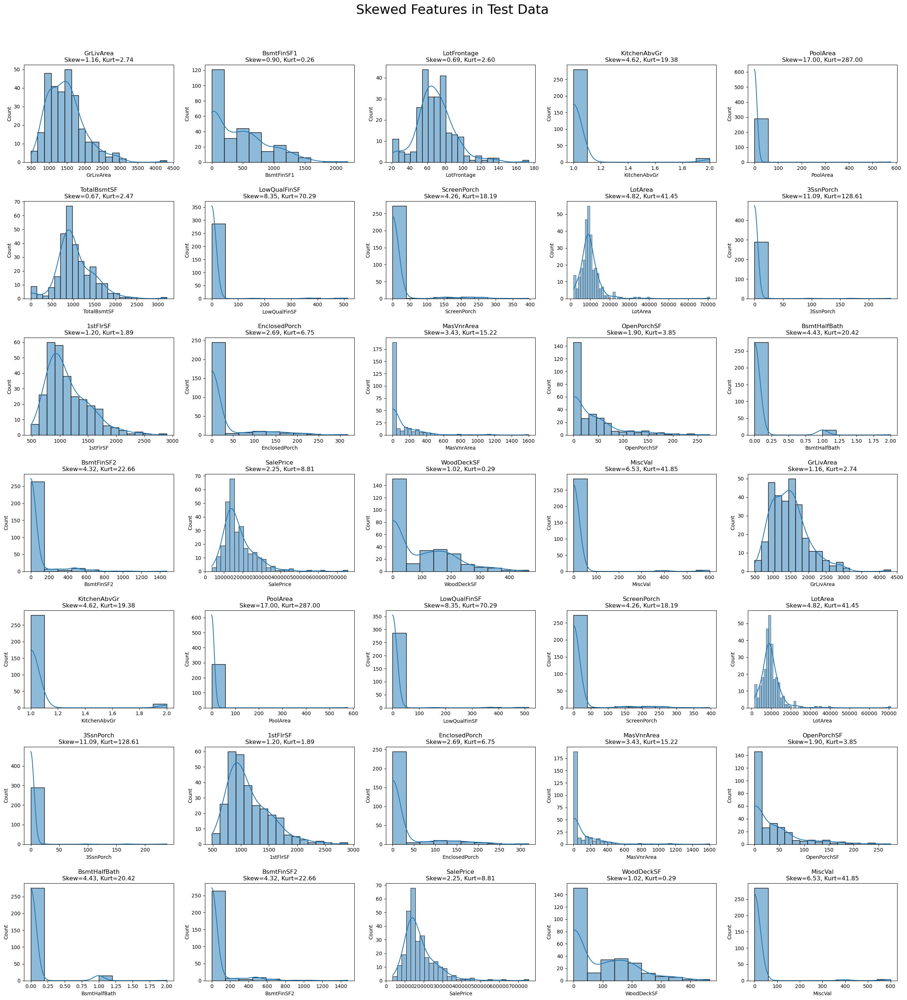

35 numeric features in Testing Daataset with skew > 1 are plotted.



In [113]:


# Pre-filter features with high skewness
skewed_features = []
for feature in numeric_numericals:
    data = df[feature].dropna()
    if len(data) >= 50:  # Ensure enough data
        if skew(data) > 1:
            skewed_features.append(feature)

cols = 5
rows = math.ceil(len(skewed_features) / cols)
figsize = (5 * cols, 4 * rows)

plt.figure(figsize=figsize)

for i, feature in enumerate(skewed_features, 1):
    data = df[feature].dropna()
    sk = skew(data)
    kurt = kurtosis(data)

    plt.subplot(rows, cols, i)
    sns.histplot(data, kde=True)
    plt.title(f"{feature}\nSkew={sk:.2f}, Kurt={kurt:.2f}")
    plt.xlabel(feature)
    plt.ylabel("Count")

plt.tight_layout()
plt.subplots_adjust(hspace=0.4)

# The main title
plt.suptitle("Skewed Features in Training Data", fontsize=26) #, fontweight='bold')

# Move subplots down to make space for title
plt.subplots_adjust(top=0.88)

plt.show()

print(f"{len(skewed_features)} numeric features in Training dataset with skew > 1 are plotted.\n\n")




# Pre-filter features with high skewness
skewed_features_test = []
for feature in numeric_numericals:
    data = df_test[feature].dropna()
    if len(data) >= 50:  # Ensure enough data
        if skew(data) > 1:
            skewed_features.append(feature)

cols = 5
rows = math.ceil(len(skewed_features) / cols)
figsize = (5 * cols, 4 * rows)

plt.figure(figsize=figsize)

for i, feature in enumerate(skewed_features, 1):
    data = df_test[feature].dropna()
    sk = skew(data)
    kurt = kurtosis(data)

    plt.subplot(rows, cols, i)
    sns.histplot(data, kde=True)
    plt.title(f"{feature}\nSkew={sk:.2f}, Kurt={kurt:.2f}")
    plt.xlabel(feature)
    plt.ylabel("Count")

plt.tight_layout()
plt.subplots_adjust(hspace=0.4)

# The main title
plt.suptitle("Skewed Features in Test Data", fontsize=26)#, fontweight='bold')

# Move subplots down to make space for title
plt.subplots_adjust(top=0.92)

plt.show()

print(f"{len(skewed_features)} numeric features in Testing Daataset with skew > 1 are plotted.\n")


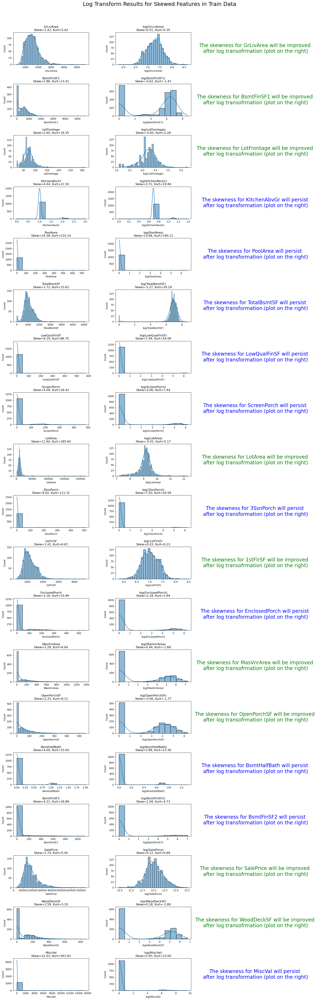

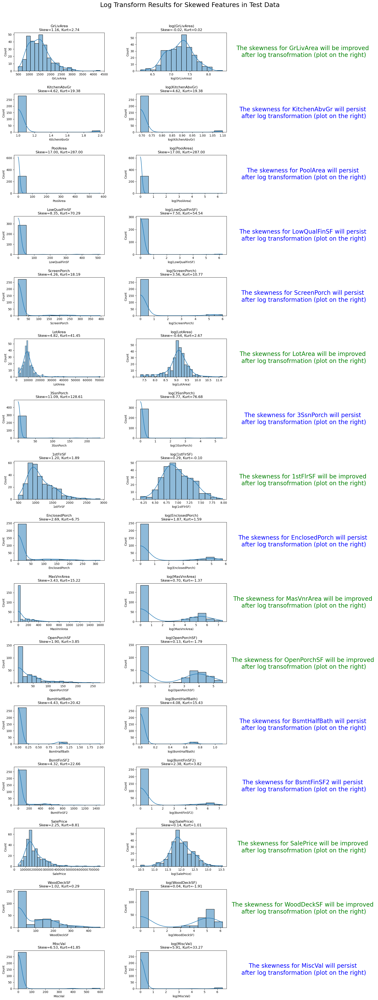

In [114]:
# Thresholds
skew_threshold = 1.0
fix_threshold = 1.0

# Filter features with high skew
skewed_features = []
for feature in numeric_numericals:
    data = df[feature].dropna()
    if len(data) >= 3 and skew(data) > skew_threshold:
        skewed_features.append(feature)

rows = len(skewed_features)
cols = 3

plt.figure(figsize=(cols * 6, rows * 3))

for i, feature in enumerate(skewed_features):
    data = df[feature].dropna()
    log_data = np.log1p(data)  # Safe log transform

    # Calculate original and log stats
    orig_sk = skew(data)
    orig_kt = kurtosis(data)
    log_sk = skew(log_data)
    log_kt = kurtosis(log_data)

    # --- Original Plot ---
    plt.subplot(rows, cols, i * 3 + 1)
    sns.histplot(data, kde=True)
    plt.title(f"{feature}\nSkew={orig_sk:.2f}, Kurt={orig_kt:.2f}")
    plt.xlabel(feature)

    # --- Log Transformed Plot ---
    plt.subplot(rows, cols, i * 3 + 2)
    sns.histplot(log_data, kde=True)
    plt.title(f"log({feature})\nSkew={log_sk:.2f}, Kurt={log_kt:.2f}")
    plt.xlabel(f"log({feature})")

    # --- Fixed Label ---
    plt.subplot(rows, cols, i * 3 + 3)
    plt.axis("off")
    if abs(log_sk) <= fix_threshold:
        plt.text(0.5, 0.5, f"The skewness for {feature} will be improved \nafter log transofrmation (plot on the right)", fontsize=20, ha='center', va='center', color='green')
    else:
        plt.text(0.5, 0.5, f"The skewness for {feature} will persist \nafter log transformation (plot on the right)", fontsize=20, ha='center', va='center', color='blue')

plt.tight_layout()
plt.subplots_adjust(hspace=0.6)

# The main title
plt.suptitle("Log Transform Results for Skewed Features in Train Data", fontsize=22)#, fontweight='bold')

# Move subplots down to make space for title
plt.subplots_adjust(top=0.95)

plt.show()



# Test data

# Filter features with high skew
skewed_features = []
for feature in numeric_numericals:
    data = df_test[feature].dropna()
    if len(data) >= 3 and skew(data) > skew_threshold:
        skewed_features.append(feature)

rows = len(skewed_features)
cols = 3

plt.figure(figsize=(cols * 6, rows * 3))

for i, feature in enumerate(skewed_features):
    data = df_test[feature].dropna()
    log_data = np.log1p(data)  # Safe log transform

    # Calculate original and log stats
    orig_sk = skew(data)
    orig_kt = kurtosis(data)
    log_sk = skew(log_data)
    log_kt = kurtosis(log_data)

    # --- Original Plot ---
    plt.subplot(rows, cols, i * 3 + 1)
    sns.histplot(data, kde=True)
    plt.title(f"{feature}\nSkew={orig_sk:.2f}, Kurt={orig_kt:.2f}")
    plt.xlabel(feature)

    # --- Log Transformed Plot ---
    plt.subplot(rows, cols, i * 3 + 2)
    sns.histplot(log_data, kde=True)
    plt.title(f"log({feature})\nSkew={log_sk:.2f}, Kurt={log_kt:.2f}")
    plt.xlabel(f"log({feature})")

    # --- Fixed Label ---
    plt.subplot(rows, cols, i * 3 + 3)
    plt.axis("off")
    if abs(log_sk) <= fix_threshold:
        plt.text(0.5, 0.5, f"The skewness for {feature} will be improved \nafter log transofrmation (plot on the right)", fontsize=20, ha='center', va='center', color='green')
    else:
        plt.text(0.5, 0.5, f"The skewness for {feature} will persist \nafter log transformation (plot on the right)", fontsize=20, ha='center', va='center', color='blue')

plt.tight_layout()
plt.subplots_adjust(hspace=0.6)

# The main title
plt.suptitle("Log Transform Results for Skewed Features in Test Data", fontsize=22)#, fontweight='bold')

# Move subplots down to make space for title
plt.subplots_adjust(top=0.95)

plt.show()



The skewness for many of the features has been fixed after using the logarithm scale.

We can now proceed with log transformation.

#### Log transformation

In [115]:
# making a backup before log transform
df_before_log_trans = df.copy()
df_test_before_log_transform = df_test.copy()

In [116]:
# Retrieving from the backed-up dataset. Please uncomment and run to retrieve the version before the log transform.
# df, dt_test = df_before_log_trans.copy(), df_test_before_log_transform.copy()

In [117]:
# Checking one feature in test and train (before applying the transform) to make sure it will change correctly.  

print (df_test[target].describe(), "\n")
print (df[target].describe())
print (len(df_test))

count       292.000000
mean     178839.811644
std       87730.751259
min       35311.000000
25%      127000.000000
50%      154150.000000
75%      209175.000000
max      755000.000000
Name: SalePrice, dtype: float64 

count      1168.000000
mean     181441.541952
std       77263.583862
min       34900.000000
25%      130000.000000
50%      165000.000000
75%      214925.000000
max      745000.000000
Name: SalePrice, dtype: float64
292


In [118]:
# df['LogSalePrice'] = np.log1p(df['SalePrice'])
# sns.histplot(df['LogSalePrice'], kde=True)

for feature in skewed_features:
    df[feature] = np.log1p(df[feature])
    df_test[feature] = np.log1p(df_test[feature])


In [119]:
# Checking one feature in test and train (after applying the transform) to make compare with previous state sure it has changed correctly.  

print (df_test[target].describe(), "\n")
print (df[target].describe())

count    292.000000
mean      11.997654
std        0.432727
min       10.471978
25%       11.751950
50%       11.945687
75%       12.250929
max       13.534474
Name: SalePrice, dtype: float64 

count    1168.000000
mean       12.030658
std         0.390606
min        10.460271
25%        11.775297
50%        12.013707
75%        12.278049
max        13.521141
Name: SalePrice, dtype: float64


### Missing Values

In [120]:
null_counts = df.isnull().sum()

with pd.option_context('display.max_rows', None, 'display.max_columns', None, 
                       'display.width', None, 'display.max_colwidth', None):
    print(null_counts)

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       217
LotArea             0
Street              0
Alley            1094
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        683
MasVnrArea          6
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           28
BsmtCond           28
BsmtExposure       28
BsmtFinType1       28
BsmtFinSF1          0
BsmtFinType2       28
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

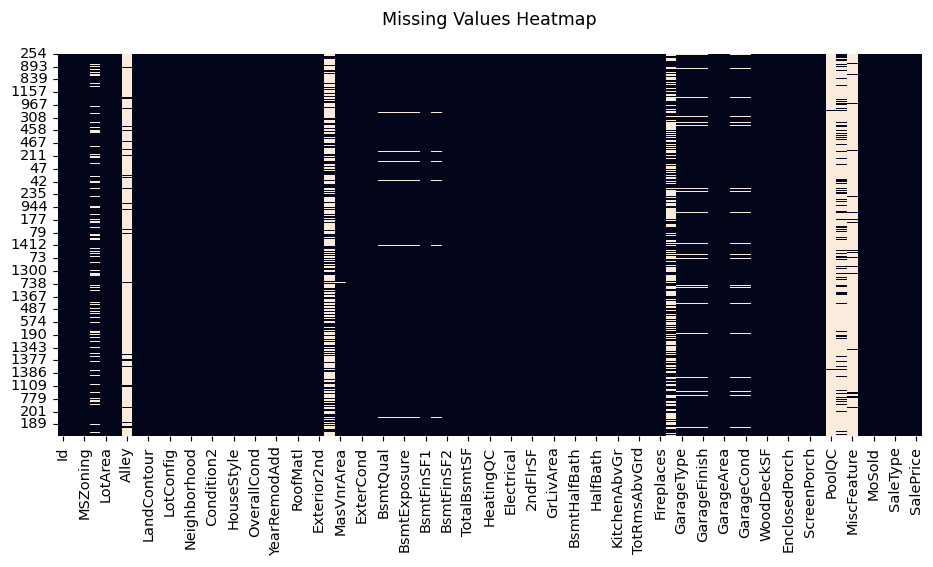

In [121]:

# Set figure size and DPI
plt.figure(figsize=(9, 5.5), dpi=105)  # Adjust dpi as needed

# heatmap
sns.heatmap(df.isnull(), cbar=False) #, cmap='viridis')  # We can customize cmap

# Set centered title explicitly
plt.title("Missing Values Heatmap", loc='center', fontsize=12, pad=20)

plt.tight_layout()
plt.show()


In [122]:
# Detecting the columns for which the count of missing values are larger than 20% of the total number of rows
null_counts = null_counts[null_counts > 0.2*len(df)]
largely_missing_cols = list(null_counts.index)

for column, count in null_counts.items():
    print(f"{column}: {count} missing")

Alley: 1094 missing
MasVnrType: 683 missing
FireplaceQu: 547 missing
PoolQC: 1162 missing
Fence: 935 missing
MiscFeature: 1122 missing


### Data Encoding

The categorical features that are not already represented with numbers will be encoded so we are able to use them in evaluation of features, and training of the model.

#### Ordinal features (mapping)

Since in the phase of fitting the model, and in feature selection phase values represented with strings may not be comfortably used, a common solution is to numeric-encode the categorical variables.

For ordinal features represented with strings, ordered integers may be used as can be seen below.

In [ ]:
# Ordinal mappings based on data documentation

quality_map = {
    'Po': 1,
    'Fa': 2,
    'TA': 3,
    'Gd': 4,
    'Ex': 5
}

bsmt_exposure_map = {
    'No': 1,
    'Mn': 2,
    'Av': 3,
    'Gd': 4,
    'NA': 0  # No basement
}

bsmt_fin_map = {
    'Unf': 1,
    'LwQ': 2,
    'Rec': 3,
    'BLQ': 4,
    'ALQ': 5,
    'GLQ': 6,
    'NA': 0  # No basement
}

garage_finish_map = {
    'Unf': 1,
    'RFn': 2,
    'Fin': 3,
    'NA': 0  # No garage
}

paved_drive_map = {
    'N': 1,
    'P': 2,
    'Y': 3
}

fence_map = {
    'MnWw': 1,
    'GdWo': 2,
    'MnPrv': 3,
    'GdPrv': 4,
    'NA': 0  # No fence
}

# List of ordinal features with respective mappings
ordinal_mappings = {
    'ExterQual': quality_map,
    'ExterCond': quality_map,
    'BsmtQual': quality_map,
    'BsmtCond': quality_map,
    'HeatingQC': quality_map,
    'KitchenQual': quality_map,
    'FireplaceQu': quality_map,
    'GarageQual': quality_map,
    'GarageCond': quality_map,
    'PoolQC': quality_map,
    'BsmtExposure': bsmt_exposure_map,
    'BsmtFinType1': bsmt_fin_map,
    'BsmtFinType2': bsmt_fin_map,
    'GarageFinish': garage_finish_map,
    'PavedDrive': paved_drive_map,
    'Fence': fence_map
}


ordinal_mappings = {
    'ExterQual':       {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1},
    'ExterCond':       {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1},
    'BsmtQual':        {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0},
    'BsmtCond':        {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0},
    'HeatingQC':       {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1},
    'KitchenQual':     {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1},
    'FireplaceQu':     {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0},
    'GarageQual':      {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0},
    'GarageCond':      {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0},
    'PoolQC':          {'Ex': 4, 'Gd': 3, 'TA': 2, 'Fa': 1, 'NA': 0},
    'Fence':           {'GdPrv': 4, 'MnPrv': 3, 'GdWo': 2, 'MnWw': 1, 'NA': 0},
    'BsmtExposure':    {'Gd': 4, 'Av': 3, 'Mn': 2, 'No': 1, 'NA': 0},
    'BsmtFinType1':    {'GLQ': 6, 'ALQ': 5, 'BLQ': 4, 'Rec': 3, 'LwQ': 2, 'Unf': 1, 'NA': 0},
    'BsmtFinType2':    {'GLQ': 6, 'ALQ': 5, 'BLQ': 4, 'Rec': 3, 'LwQ': 2, 'Unf': 1, 'NA': 0},
    'GarageFinish':    {'Fin': 3, 'RFn': 2, 'Unf': 1, 'NA': 0},
    'PavedDrive':      {'Y': 2, 'P': 1, 'N': 0},
    'LotShape':        {'Reg': 4, 'IR1': 3, 'IR2': 2, 'IR3': 1},
    'LandSlope':       {'Gtl': 3, 'Mod': 2, 'Sev': 1},
    'Functional':      {'Typ': 7, 'Min1': 6, 'Min2': 5, 'Mod': 4, 'Maj1': 3, 'Maj2': 2, 'Sev': 1, 'Sal': 0}
    # 'OverallQual':     {k: k for k in range(1, 11)},  # Already ordinal numeric
    # 'OverallCond':     {k: k for k in range(1, 11)},  # Already ordinal numeric
}

# Also note that: OverallQual and OverallCond are already numeric, but ordinal in nature, no transformation is needed

In [124]:
# Apply the mappings
for feature, mapping in ordinal_mappings.items():
    df[feature] = df[feature].map(mapping)
    df_test[feature] = df_test[feature].map(mapping)

In [125]:
# To check the data after the ordinal features are encoded:

df[[a for a in ordinal_feat]].dropna()  # All values should be numbers

,ExterQual,ExterCond,BsmtQual,BsmtCond,HeatingQC,KitchenQual,FireplaceQu,GarageQual,GarageCond,PoolQC,...,BsmtExposure,BsmtFinType1,BsmtFinType2,GarageFinish,PavedDrive,LotShape,LandSlope,Functional,OverallQual,OverallCond
810,3,3,3.0,3.0,2,4,2.0,3.0,3.0,2.0,...,1.0,5.0,2.0,2.0,3,Reg,Gtl,Typ,6,6
1182,4,3,5.0,3.0,5,5,3.0,3.0,3.0,5.0,...,3.0,6.0,1.0,3.0,3,IR1,Gtl,Typ,10,5
197,4,4,3.0,3.0,4,4,5.0,3.0,3.0,5.0,...,1.0,6.0,2.0,1.0,3,Reg,Gtl,Typ,8,4
1386,3,3,4.0,3.0,3,4,3.0,3.0,3.0,2.0,...,1.0,4.0,2.0,2.0,3,IR1,Gtl,Typ,7,5
1423,4,4,4.0,3.0,3,4,4.0,4.0,4.0,4.0,...,3.0,1.0,1.0,1.0,3,IR1,Gtl,Typ,6,7


#### Nominal features (one-hot encoding)

For nominal features we may not define an order, and so methods such as one-hot encoding will be useful.

In [126]:
# Function to one-hot encode nominal features using train data and apply to test data
def encode_nominal(train_df, test_df, extra_nominal=[]):
    # Step 1: Detect object columns (categorical)
    object_cols = train_df.select_dtypes(include='object').columns.tolist()
    
    # Step 2: Remove known ordinal columns
    nominal_features = [col for col in object_cols if col not in ordinal_feat]
    
    # Step 3: Add numeric-but-categorical columns if needed (e.g., MSSubClass)
    nominal_features += extra_nominal
    
    # We can also ensure numeric categorical values are strings for OHE (as a double check)
    for col in extra_nominal:
        train_df[col] = train_df[col].astype(str)
        test_df[col] = test_df[col].astype(str)

    # Step 4: Initialize the encoder
    ohe = OneHotEncoder(handle_unknown='ignore', sparse=False)

    # Step 5: Fit on train data
    ohe.fit(train_df[nominal_features])

    # Step 6: Transform both train and test
    train_encoded = pd.DataFrame(
        ohe.transform(train_df[nominal_features]),
        columns=ohe.get_feature_names_out(nominal_features),
        index=train_df.index
    )

    test_encoded = pd.DataFrame(
        ohe.transform(test_df[nominal_features]),
        columns=ohe.get_feature_names_out(nominal_features),
        index=test_df.index
    )

    # Step 7: Drop original nominal features and merge encoded versions
    train_df = train_df.drop(columns=nominal_features)
    test_df = test_df.drop(columns=nominal_features)

    train_df = pd.concat([train_df, train_encoded], axis=1)
    test_df = pd.concat([test_df, test_encoded], axis=1)

    return train_df, test_df, ohe  # return encoder in case you need it later


In [127]:
# Applying one-hot encoding

### Processing Text Features

There are no text features in the dataset

### Scaling

Scaling is needed as we are going to use it in linear regression (regression models are sensitive to scaling).

We will not scale OverallQual as it is a categorical values.


In [128]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
254,255,20,RL,70.0,9.036106,Pave,NaN,Reg,Lvl,AllPub,...,0.0,NaN,NaN,NaN,0.0,6,2010,WD,Normal,11.884496
1066,1067,60,RL,59.0,8.966739,Pave,NaN,IR1,Lvl,AllPub,...,0.0,NaN,NaN,NaN,0.0,5,2009,WD,Normal,12.089544
638,639,30,RL,67.0,9.080004,Pave,NaN,Reg,Lvl,AllPub,...,0.0,NaN,3.0,NaN,0.0,5,2008,WD,Normal,11.350418
799,800,50,RL,60.0,8.881975,Pave,NaN,Reg,Lvl,AllPub,...,0.0,NaN,3.0,NaN,0.0,6,2007,WD,Normal,12.072547
380,381,50,RL,50.0,8.517393,Pave,Pave,Reg,Lvl,AllPub,...,0.0,NaN,NaN,NaN,0.0,5,2010,WD,Normal,11.751950


In [44]:
# Scaling is needed as we are going to use it in linear regression (regression models are sensitive to scaling)
# We will not scale OverallQual as it is a categorical values

# Define feature sets
features_to_scale = ['GrLivArea', 'GarageCars', 'TotalBsmtSF']
features_to_keep = ['OverallQual']


# Define target and feature columns
target = "SalePrice"
feature_columns = feature_columns = [col for col in df.columns if col != "SalePrice"]  ##['GrLivArea', 'GarageCars', 'TotalBsmtSF', 'OverallQual']

# Split into features (X) and target (y)
X_train = df[feature_columns]
y_train = df[target]


# Split into features (X) and target (y)
X_test = df_test[feature_columns]
y_test = df_test[target]


# Fit scaler on training data
scaler = StandardScaler()
X_train_scaled_part = scaler.fit_transform(X_train[features_to_scale])
X_test_scaled_part = scaler.transform(X_test[features_to_scale])

# Combine scaled and unscaled parts
X_train_scaled = pd.concat([
    X_train[features_to_keep].reset_index(drop=True),
    pd.DataFrame(X_train_scaled_part, columns=features_to_scale)
], axis=1)

X_test_scaled = pd.concat([
    X_test[features_to_keep].reset_index(drop=True),
    pd.DataFrame(X_test_scaled_part, columns=features_to_scale)
], axis=1)

# restore original indices
X_train_scaled.index = X_train.index
X_test_scaled.index = X_test.index


In [45]:
print (y_train.describe())
print (y_test.describe())

count    1168.000000
mean       12.030658
std         0.390606
min        10.460271
25%        11.775297
50%        12.013707
75%        12.278049
max        13.521141
Name: SalePrice, dtype: float64
count    292.000000
mean      11.997654
std        0.432727
min       10.471978
25%       11.751950
50%       11.945687
75%       12.250929
max       13.534474
Name: SalePrice, dtype: float64


## 7. Feature Engineering

There are a number of features that may be created/dropped/changed in this dataset.

For instance, we can create a new feature 'age' which is the duration of time from when the property is built until when the property is sold, and we can consequently drop those two features. 

In an initial evaluation feature engineering did not prove useful in this problem, and so it is ignored in this problem.

## 8. Feature Selection and Dimensionality Reduction

### Correlated features

In [46]:
# Compute correlation matrix for numeric features, then sort by correlation with 'SalePrice'
correlation_matrix = df.corr(numeric_only=True)['SalePrice'].sort_values(ascending=False)

# Select the top 10 features most positively correlated with 'SalePrice' (excluding 'SalePrice' itself)
top_correlated_features = correlation_matrix.drop('SalePrice').head(10)

# Set the plot size
plt.figure(figsize=(10, 6))

# Print most correlated features 
print(top_correlated_features.index.tolist())

# Checking if any of the top correlated features have large amount of missing values (more than 20%)
missing_and_correlated = [item for item in null_counts.index if item in top_correlated_features]

if missing_and_correlated:
    for item in missing_and_correlated:
        print(item)
else:
    print("\n No feature in top correlated ones has more than 20% missing values.")


['OverallQual', 'GrLivArea', 'GarageCars', 'KitchenQual', 'ExterQual', 'GarageArea', 'BsmtQual', 'TotalBsmtSF', '1stFlrSF', 'FullBath']

 No feature in top correlated ones has more than 20% missing values.


<Figure size 1000x600 with 0 Axes>

### Visualizing the correlated features

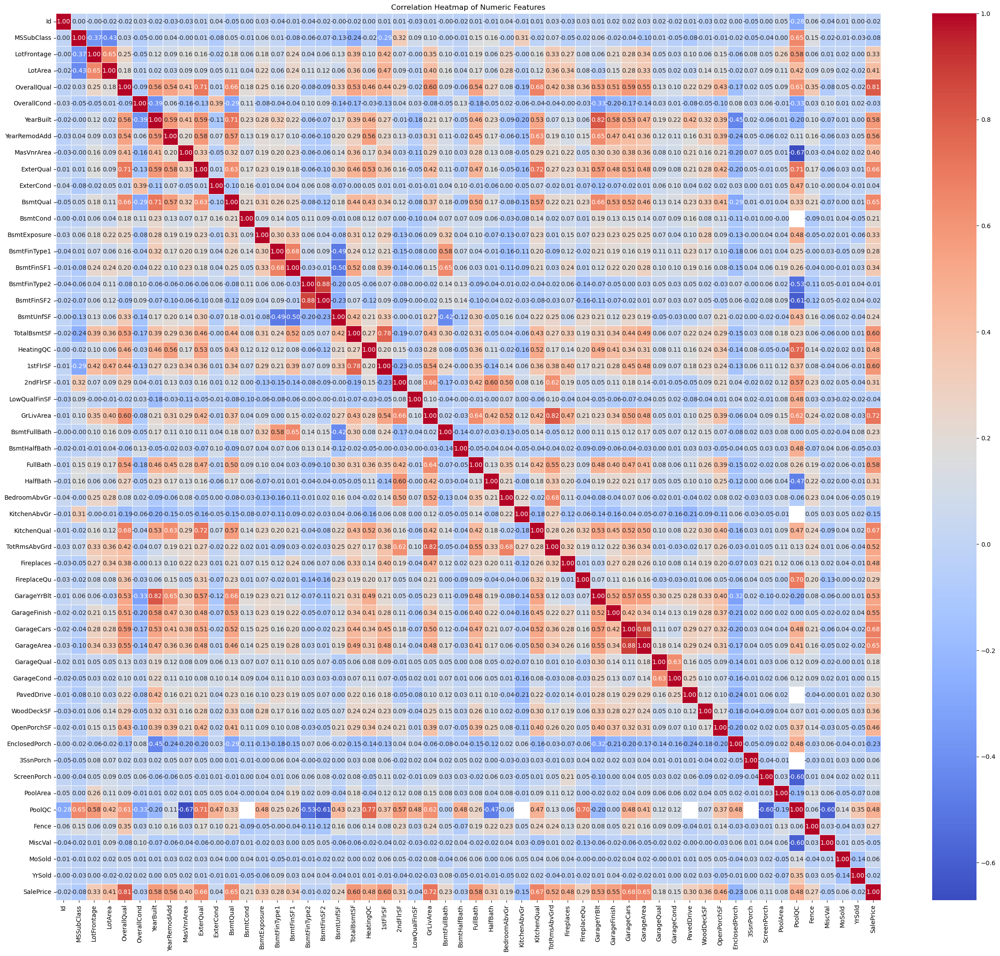

In [47]:
plt.figure(figsize=(30, 26))
sns.heatmap(df.corr(numeric_only=True), cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Numeric Features")
plt.show()

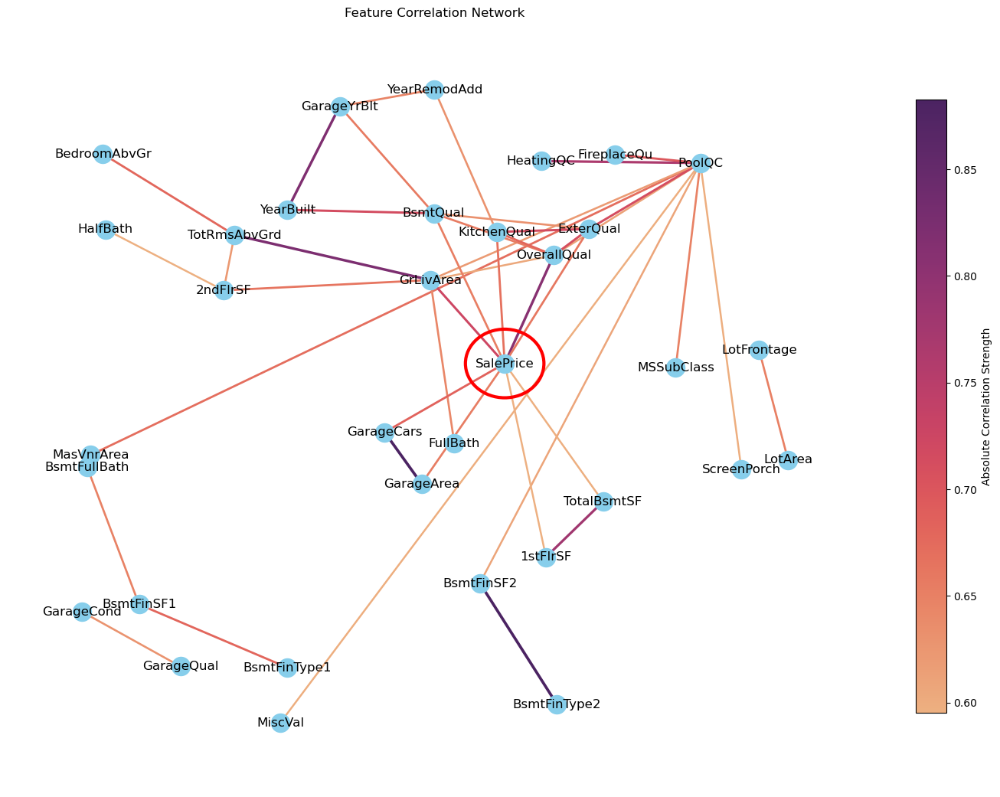

In [48]:

# Create correlation matrix and filter strong correlations
corr_matrix = df.corr(numeric_only=True)
threshold = 0.59  # only show correlations above this
strong_corrs = corr_matrix[(corr_matrix.abs() > threshold) & (corr_matrix.abs() < 1.0)].stack().reset_index()
strong_corrs.columns = ['Feature1', 'Feature2', 'Correlation']

# Create graph
G = nx.Graph()
for _, row in strong_corrs.iterrows():
    G.add_edge(row['Feature1'], row['Feature2'], weight=row['Correlation'])

# Draw network
# plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, k=0.5)
edges = G.edges(data=True)
weights = [abs(d['weight'])*3 for (u,v,d) in edges]  # scale edge width
# nx.draw(G, pos, with_labels=True, width=weights, edge_color=weights, edge_cmap=plt.cm.viridis, node_color='skyblue')
# plt.title("Feature Correlation Network")
# plt.show()


# correlation matrix and graph creation (assumed already done)

# # Draw network with edge colors
# plt.figure(figsize=(10, 8))
# pos = nx.spring_layout(G, k=0.5)

# edges = G.edges(data=True)
correlations = [abs(d['weight']) for (u, v, d) in edges]
# weights = [c * 3 for c in correlations]

# # Normalize for colormap
norm = plt.Normalize(min(correlations), max(correlations))
edge_colors = sns.color_palette("flare", as_cmap=True)(norm(correlations))   #plt.cm.viridis(norm(correlations))

# # Draw the graph
# fig, ax = plt.subplots(figsize=(10, 8))
# nx.draw(G, pos,
#         with_labels=True,
#         ax=ax,
#         width=weights,
#         edge_color=edge_colors,
#         edge_cmap=plt.cm.viridis,
#         node_color='skyblue')



fig, ax = plt.subplots(figsize=(18, 13))
nx.draw(G, pos,
        with_labels=True,
        ax=ax,
        width=weights,
        edge_color=edge_colors,
        edge_cmap=sns.color_palette("flare", as_cmap=True), # plt.cm.viridis,
        node_color='skyblue')

# Highlight the target variable (e.g., "SalePrice")
target_node = 'SalePrice'
if target_node in pos:
    x, y = pos[target_node]
    highlight = mpatches.Circle((x, y), radius=0.1, transform=ax.transData,
                                fill=False, edgecolor='red', linewidth=3)
    ax.add_patch(highlight)
else:
    print(f"Warning: Target node '{target_node}' not found in graph.")

# Add colorbar
sm = plt.cm.ScalarMappable(cmap=sns.color_palette("flare", as_cmap=True), norm=norm) #(cmap=plt.cm.viridis, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, shrink=0.8)
cbar.set_label('Absolute Correlation Strength')

plt.title("Feature Correlation Network")
plt.show()


### Results from Correlation-based Selection 

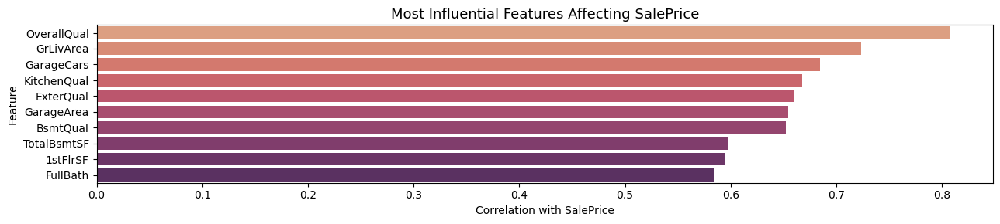

In [49]:
# Create a horizontal bar plot to visualize the top correlated features

plt.figure(figsize=(13, 3), dpi=100)  # width=10 inches, height=6 inches

sns.barplot(
    x=top_correlated_features.values,
    y=top_correlated_features.index,
    palette='flare'  # 'viridis' may be better for better readability
)


# Add plot title and axis labels
plt.title("Most Influential Features Affecting SalePrice", fontsize=13)
plt.xlabel("Correlation with SalePrice")
plt.ylabel("Feature")

# Improve layout
plt.tight_layout()

# Display the plot
plt.show()

### Statistical Significance

We will make sure if our final selected features have statistical significance.

#### a. Statistical significance for categorical Features

In [50]:
selected_features = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'Neighborhood']
selected_categorical_features = list (set(selected_features) & (set(ordinal_feat)|set(numeric_nominals)) )
# selected_categorical_features = ['OverallQual', 'Neighborhood']


#def run_anova_tests(df, selected_features, target_var='SalePrice'):
print(f"\n Running ANOVA tests for 'SalePrice' against categorical variables: \n")

results = []

for cat_var in selected_categorical_features:
    # Checking if the feature has only one category
    if df[cat_var].nunique() < 2:
        print(f" Skipping '{cat_var}'  only one unique category.\n")
        continue

    groups = [group['SalePrice'].dropna().values for name, group in df.groupby(cat_var)]
    
    if len(groups) < 2:
        print(f" Skipping '{cat_var}'  less than two valid groups.\n")
        continue

    try:
        f_stat, p_value = f_oneway(*groups)
        results.append({
            'Variable': cat_var,
            'F-statistic': f_stat,
            'p-value': p_value
        })

        print(f"   Variable: {cat_var}")
        print(f"   F-statistic: {f_stat:.4f}")
        print(f"   p-value: {p_value:.4e} {'(Significant)' if p_value < 0.05 else '(Not Significant)'}\n")

    except Exception as e:
        print(f" Error processing {cat_var}: {e}\n")

# return pd.DataFrame(results)

# Example usage:
# categorical_columns = ['Neighborhood', 'HouseStyle', 'Exterior1st']
# result_df = run_anova_tests(df, categorical_columns)
# print(result_df.sort_values('p-value'))



 Running ANOVA tests for 'SalePrice' against categorical variables: 

   Variable: OverallQual
   F-statistic: 248.0575
   p-value: 6.9040e-263 (Significant)



#### b. Statistical significancce for numeric Features

In [51]:
selected_features = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF']
selected_numerical_features = list (set(selected_features) & (set(numeric_numericals)) )


# def run_correlation_tests(df, numeric_vars, target_var='SalePrice'):
print(f"\n Running correlation tests for 'SalePrice' against numerical variables: \n")

results = []

for num_var in selected_numerical_features:
    # Remove NaNs
    x = df[num_var].dropna()
    y = df['SalePrice'].dropna()
    common_idx = x.index.intersection(y.index)
    x = x.loc[common_idx]
    y = y.loc[common_idx]
    if num_var in ['SalePrice']:
        continue

    if len(x) < 3:
        print(f" Skipping '{num_var}'  not enough valid data.\n")
        continue

    try:
        pearson_corr, pearson_p = pearsonr(x, y)
        spearman_corr, spearman_p = spearmanr(x, y)

        results.append({
            'Variable': num_var,
            'Pearson_r': pearson_corr,
            'Pearson_p': pearson_p,
            'Spearman_r': spearman_corr,
            'Spearman_p': spearman_p
        })

        print(f"   Variable: {num_var}")
        print(f"   Pearson:  r = {pearson_corr:.4f}, p = {pearson_p:.4e} {'(Significant)' if pearson_p < 0.05 else '(Not Significant)'}")
        print(f"   Spearman: r = {spearman_corr:.4f}, p = {spearman_p:.4e} {'(Significant)' if spearman_p < 0.05 else '(Not Significant)'}\n")

    except Exception as e:
        print(f" Error processing {num_var}: {e}\n")

    # return pd.DataFrame(results)

# Example usage:
# numeric_columns = ['GrLivArea', 'TotalBsmtSF', 'LotArea']
# result_df = run_correlation_tests(df, numeric_columns)
# print(result_df.sort_values('Pearson_p'))



 Running correlation tests for 'SalePrice' against numerical variables: 

   Variable: GarageCars
   Pearson:  r = 0.6845, p = 3.2656e-162 (Significant)
   Spearman: r = 0.6868, p = 9.9448e-164 (Significant)

   Variable: GrLivArea
   Pearson:  r = 0.7236, p = 6.2090e-190 (Significant)
   Spearman: r = 0.7234, p = 7.8488e-190 (Significant)

   Variable: TotalBsmtSF
   Pearson:  r = 0.5972, p = 8.1415e-114 (Significant)
   Spearman: r = 0.5950, p = 8.7602e-113 (Significant)



### The relationships between the top features
Pairplot is used to **visualize the relationships between the top features most correlated with SalePrice**.
It creates a grid of scatter plots showing how each pair of features relates, which can help reveal linear trends, clusters, or outliers

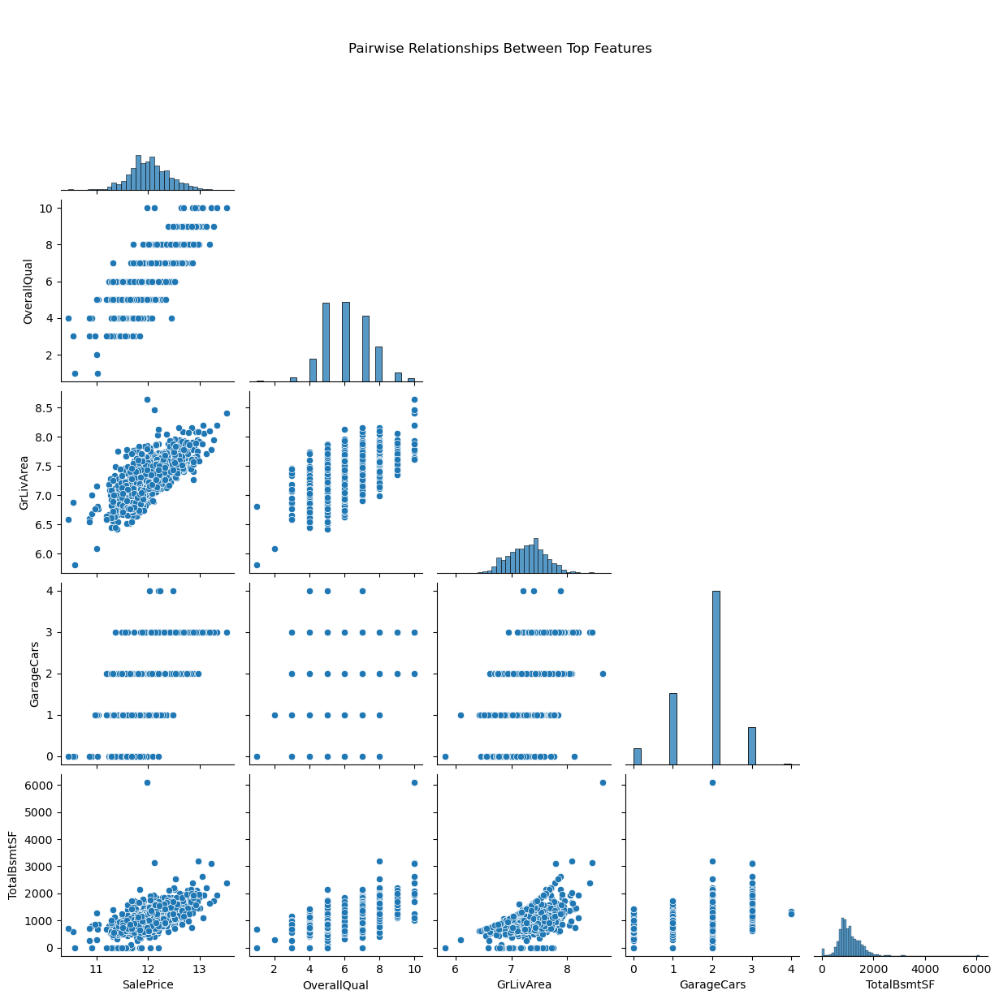

In [52]:
# Create a pairplot using seaborn
# - `corner=True` plots only the lower triangle (no redundant mirrored plots)
sns.pairplot(df[selected_features], corner=True)

# Add a supertitle above the entire figure
# y adjusts the vertical position to avoid overlap with plots
plt.suptitle("Pairwise Relationships Between Top Features", y=0.95)

# Display the plot
plt.show()

In [53]:
strong_corrs.head() 
print()
corr_matrix.head()

# corr_matrix.info()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.002216,-0.004147,-0.016710,-0.017880,0.029571,-0.022142,-0.032560,-0.025742,0.012961,...,0.003376,-0.047019,0.002980,0.054321,-0.283285,0.063613,-0.040405,0.013713,0.004211,-0.015302
MSSubClass,0.002216,1.000000,-0.371269,-0.428343,0.029719,-0.052768,-0.001928,0.036081,-0.000058,0.008504,...,-0.017815,-0.052930,-0.035197,0.003846,0.648277,0.147274,-0.024606,-0.014139,-0.028758,-0.079380
LotFrontage,-0.004147,-0.371269,1.000000,0.650934,0.249726,-0.051725,0.123858,0.091253,0.163945,0.163879,...,-0.055655,0.077424,0.047582,0.261996,0.584938,0.056200,0.007294,0.023850,0.003097,0.334227
LotArea,-0.016710,-0.428343,0.650934,1.000000,0.179091,0.013505,0.023671,0.033441,0.089786,0.092394,...,-0.017301,0.068154,0.094931,0.114022,0.423399,0.089860,0.089782,0.022737,-0.017854,0.411305
OverallQual,-0.017880,0.029719,0.249726,0.179091,1.000000,-0.087599,0.558124,0.538251,0.406695,0.711147,...,-0.168083,0.022880,0.046161,0.088467,0.611650,0.346310,-0.077648,0.053355,-0.017635,0.807946


### Dropping the columns with large amount of missing values: 

Now we will drop columns with more missing values than 20% of the whole dataframe rows. We did not drop them previously to not lose significant features. If there were any cases where the column was among top correlated ones and had large amount of missing values, then imputation or similar methods could be used on that column.

In [54]:
# Saving before dropping the columns with missing values
df_before_drop = df.copy()

In [55]:
if largely_missing_cols in list(df.columns): 
    df = df.drop(columns=largely_missing_cols)
    print (f"These columns are dropped: {largely_missing_cols}")
else:
    print ("there are no columns with large number of missing values to be dropped")

# df = df[['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', 
#          '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd']]

there are no columns with large number of missing values to be dropped


Then we will handle the missing values in the top 10 correlated features, even if it is not a large portion of data.

In [56]:
# Step 1: Identify key features strongly linked to the target variable 'SalePrice'
key_features = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea',
                'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd',
                'YearBuilt', 'YearRemodAdd']

# Step 2: Detect columns in the dataset with missing entries
columns_with_na = df.columns[df.isnull().any()].tolist()

# Step 3: Filter out key features that also contain missing values
key_features_with_na = [col for col in key_features if col in columns_with_na]

# Step 4: Report the findings
if key_features_with_na:
    print("Key features containing missing values:")
    print(key_features_with_na)
    # OPTIONAL: Choose how to handle missing values
    # --- Here we should how decide how we would like to treat the missing values. 
    # There are two options, dropping (option A) and imputation (option B)
    # Uncomment one of the following blocks as needed ---

    # Option A: Remove rows that have any missing values
    # df = df.dropna()
    # print("Rows with missing values have been removed.")

    # Option B: Fill missing values
    # Iterate through each column with missing data
    for col in key_features_with_na:
        if df[col].dtype == 'object':  # Categorical feature
            most_frequent = df[col].mode()[0]
            df[col].fillna(most_frequent, inplace=True)
            print(f"Filled missing values in '{col}' with mode: {most_frequent}")
        else:  # Numerical feature
            median_value = df[col].median()
            df[col].fillna(median_value, inplace=True)
            print(f"Filled missing values in '{col}' with median: {median_value}")
else:
    print("No missing data found in 10 top-correlated features related to SalePrice.")


No missing data found in 10 top-correlated features related to SalePrice.


### Some interpretations and remarks about the features

1. OverallQual: 

It directly Measures What Buyers Care About. It captures how high-end or low-end a house is: finishes, materials, craftsmanship.

A house built in 1970 with an OverallQual of 9 (e.g. because of a luxury renovation) can sell much higher than a 2015 house with an OverallQual of 5.

It reflects the current state of the home, not just its age.

---------------------

2. GrLivArea (Above ground living area in sq ft):

It directly measures the size of the main living space, which is one of the strongest price factors.

Simply said: Bigger home -> higher value.

Especially important in neighborhoods where land value is already priced in.

It is worthy to note: Adding TotalBsmtSF may improve predictive power by considering the real usable space.

---------------------

3. GarageCars / GarageArea:

GarageCars is more predictive than GarageArea, because buyers care more about 'How many cars they I fit?', not the area.

High values (3+), I think may signal luxury homes, and that is why they increase price more than linearly expected.

It is a categorical numeric variable, not continuous, but ordered.

---------------------

4. TotalBsmtSF:

Important for the same reason as GrLivArea: usable space.

---------------------

5. KitchenQual

Strong price indicator. Kitchens and bathrooms drive renovation ROI.

Homes with Ex or Gd kitchens signal modern appliances, countertops, layout.

this factor, together with the area of the building (GrLivArea) and the OverallQual seem to have a high influence on the final perception of the value of the house (when only the building itself is considered, not surrounding factors such as location and neighborhood)

---------------------

6. FullBath / HalfBath

Important but non-linear.

Going from 1 → 2 full baths is a big price jump.

Extra baths (3+) have diminishing returns.

Buyers often filter listings by min bathrooms → directly tied to saleability.

---------------------

7. Fireplaces + FireplaceQu

An example of a feature with aesthetic value, not necessarily utility.

1 fireplace → bump in value.

More than 1 or poor quality (e.g., prefab) → less return.

Higher importance in colder regions or high-end neighborhoods.

---------------------

8. Neighborhood

Crucial location feature.

Captures land value, school district, prestige, crime rate, etc.

Can create price strata independent of house characteristics.

Often the most important categorical variable.

Best when grouped or frequency-encoded to smooth sparse categories.

---------------------

9. LotArea / LotFrontage

Lot size influences price, but:

Impact varies non-linearly.

In urban areas, small lot size might still command a high price.

Larger lots help in luxury or suburban homes.

---------------------

10. ExterQual / BsmtQual / GarageQual

These "Qual" features are highly predictive because they capture quality, which raw square footage misses.

Correlates with construction standards, maintenance, materials.

---------------------

11. YearRemodAdd and IsRemodeled

Better than YearBuilt alone — tells whether home has been updated.

Homes remodeled recently usually sell higher.

Especially when structural (roof, HVAC, windows) and cosmetic updates are made.

---------------------

12. Electrical / HeatingQC

Signals modernization, safety, efficiency.

Low values (like FuseP or Grav) → price penalty.

Modern systems imply lower future maintenance → attractive to buyers.

---------------------

13. Condition1 / Condition2

Describes proximity to positive (park, greenbelt) or negative (railroad) features.

Homes near positive features (PosN, PosA) often have price premiums.

Adjacent to railroad (RRAn, RRAe) --> sharp price discount.

May be non-obvious without domain knowledge 

---------------------

14. LotConfig / LandSlope / LandContour

Slope and lot configuration affect buildability, privacy, and curb appeal.

Steep slopes (Sev) or odd lots (IR3) means lower utility and lower price.

---------------------

15. MasVnrType + MasVnrArea

Masonry veneer = brick or stone finish → higher quality feel.

Not structural, but improves aesthetics, insulation, and perceived value.

Good indicator of luxury in neighborhoods where most homes are basic siding.

---------------------

16. MoSold / YrSold

Seasonality effect: Homes sold in spring/summer typically fetch higher prices.

YrSold usually not very important unless there's large scale change (e.g., post-recession bounce).

---------------------

17. Functional

Captures functional obsolescence (e.g., walk-through bedrooms, tiny kitchens).

Homes with Min2, Maj1, Maj2 → real usability problems → price drop.

---------------------

18. TotRmsAbvGrd

Related to GrLivArea but adds insight into layout.

A 2000 sq ft home with 10 rooms is very different from one with 5 — rooms might be smaller, or layout inefficient.

---------------------

19. BedroomAbvGr, KitchenAbvGr
Important in filtering listings, but limited price impact beyond 3–4 bedrooms.

Kitchen count usually = 1 → more than 1 could indicate multi-family or oddity.

---------------------

20. PoolArea, Fence, MiscFeature

These features are very rare --> small direct effect, but:

Can be major differentiators in high-end homes.

Pools add cost, but not always value depending on climate.

Good fences = more privacy = some value boost.



### Final top features (considering correlation, significance, etc.)

In [57]:
# Select a list of top features, including the target 'SalePrice'
selected_features = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF']

## 9. Modeling and Evaluation

### Fitting the model

Currently, two models are chosen for modeling. 

1. Linear Regression
2. Random Forests

#### Linear Regression

We may now initialize the model, and then fit it to the training data.

Then we make predictions and use below metrics to evaluate the model:

1. MAE (Mean Absolute Error)
1. RMSE (Root Mean Squared Error)
1. R² (Coefficient of Determination)


In [59]:
# Initialize the model
lr_model = LinearRegression()

# Fitting the model on the scaled training set
lr_model.fit(X_train_scaled, y_train)

# Predicting on the Test Set
y_pred = lr_model.predict(X_test_scaled)


MAE  : 0.13
RMSE : 0.18
R²   : 0.8275


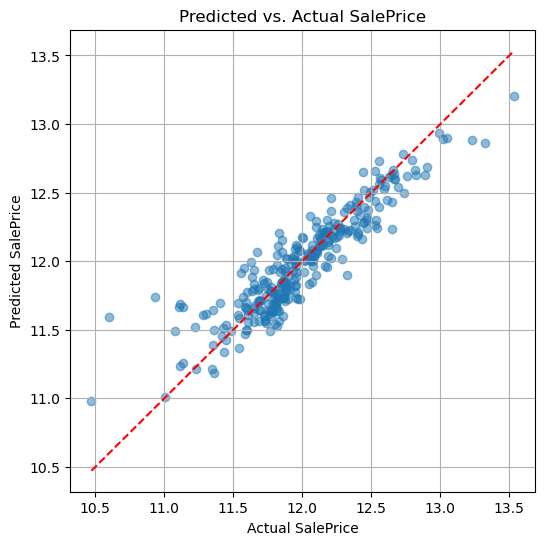

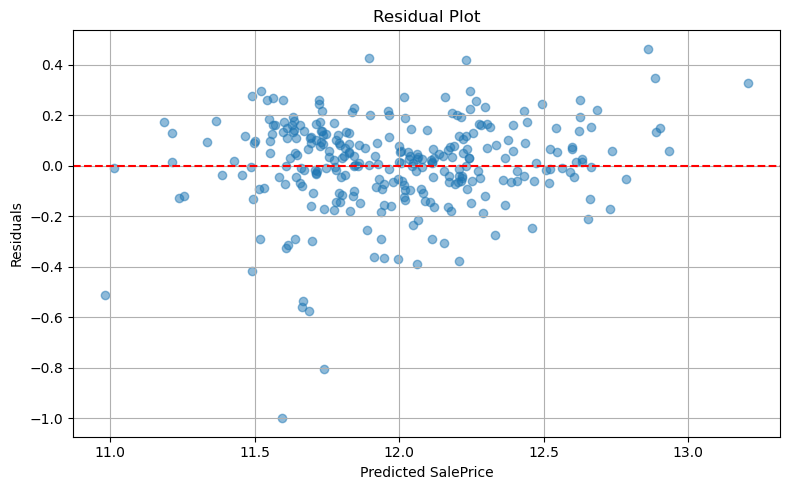

In [ ]:
# Evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE  : {mae:.2f}")
print(f"RMSE : {rmse:.2f}")
print(f"R²   : {r2:.4f}")

# Evaluation results
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_pred, alpha=0.5)#, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # ideal line
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Predicted vs. Actual SalePrice')
plt.grid(True)
plt.show()


# Checking Residuals
residuals = y_test - y_pred

plt.figure(figsize=(8, 5))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.grid(True)
# plt.show()


# Improve layout
plt.tight_layout()

# Display the plot
plt.show()


#### Features Importance


Feature Importances (based on coefficients):
       Feature  Importance
0  OverallQual    0.118821
1    GrLivArea    0.114979
2   GarageCars    0.088924
3  TotalBsmtSF    0.059062


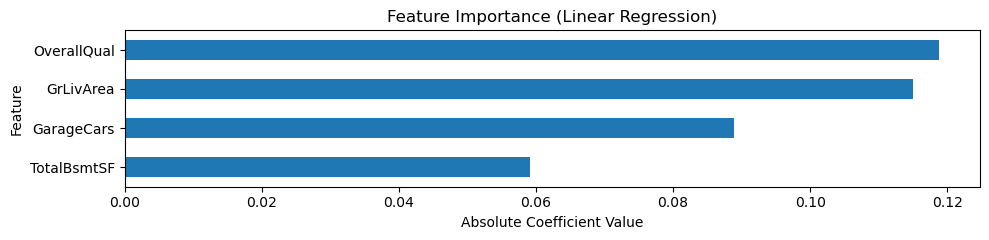

In [83]:

# Get coefficients
coefficients = lr_model.coef_

# Get feature names
feature_names = X_train_scaled.columns

# Create DataFrame
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': coefficients
})

# It is optional: We can take absolute value to show magnitude of impact
feature_importance_df['Abs_Importance'] = feature_importance_df['Importance'].abs()

# Sort by absolute importance
feature_importance_df = feature_importance_df.sort_values(by='Abs_Importance', ascending=False)

# Display
print("\nFeature Importances (based on coefficients):")
print(feature_importance_df[['Feature', 'Importance']])

# Plot
feature_importance_df.plot(
    kind='barh',
    x='Feature',
    y='Abs_Importance',
    legend=False,
    figsize=(10, 2.5),
    title='Feature Importance (Linear Regression)'
)
plt.xlabel('Absolute Coefficient Value')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

#### Random Forest

Random Forest Performance
MAE  : 0.1205
RMSE : 0.1756
R²   : 0.8348

 Baseline (Mean Predictor)
MAE  : 0.3371
RMSE : 0.4332
R²   : -0.0058


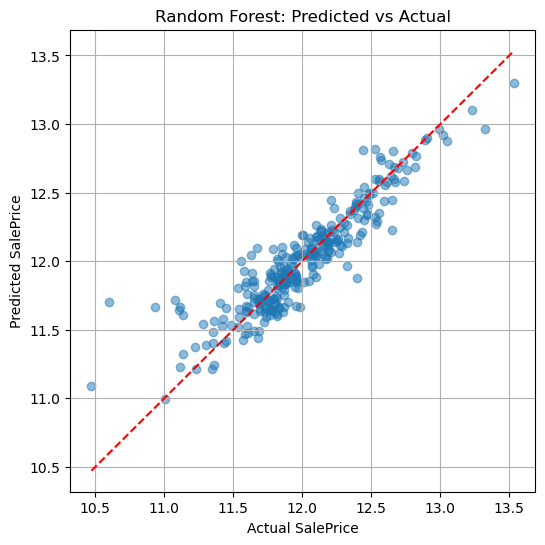

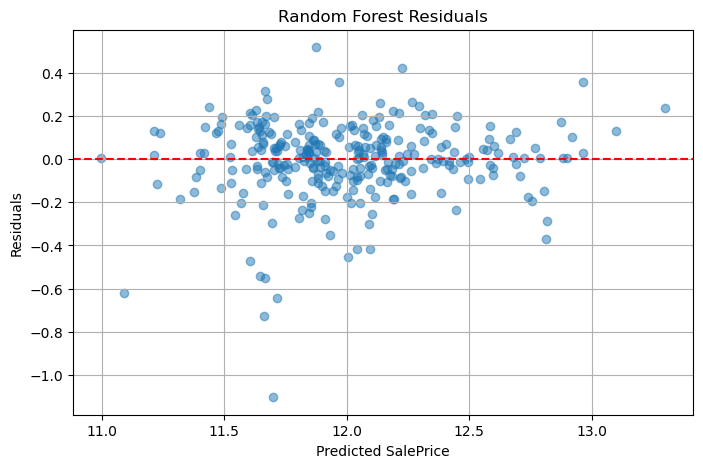

In [63]:
# 1. Fit Random Forest
rf_model = RandomForestRegressor(random_state=42, n_estimators=100)
rf_model.fit(X_train_scaled, y_train)

# 2. Predict on Test Set
y_rf_pred = rf_model.predict(X_test_scaled)

# 3. Evaluate Model Performance
mae = mean_absolute_error(y_test, y_rf_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_rf_pred))
r2 = r2_score(y_test, y_rf_pred)

print("Random Forest Performance")
print(f"MAE  : {mae:.4f}")
print(f"RMSE : {rmse:.4f}")
print(f"R²   : {r2:.4f}")


# 4. Compare to Baseline
baseline = DummyRegressor(strategy='mean')
baseline.fit(X_train_scaled, y_train)
y_base_pred = baseline.predict(X_test_scaled)

baseline_mae = mean_absolute_error(y_test, y_base_pred)
baseline_rmse = np.sqrt(mean_squared_error(y_test, y_base_pred))
baseline_r2 = r2_score(y_test, y_base_pred)

print("\n Baseline (Mean Predictor)")
print(f"MAE  : {baseline_mae:.4f}")
print(f"RMSE : {baseline_rmse:.4f}")
print(f"R²   : {baseline_r2:.4f}")

# 5. Visualize Predicted vs Actual
plt.figure(figsize=(6, 6))
plt.scatter(y_test, y_rf_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual SalePrice")
plt.ylabel("Predicted SalePrice")
plt.title("Random Forest: Predicted vs Actual")
plt.grid(True)
plt.show()

# 6. Visualize Residuals
residuals = y_test - y_rf_pred

plt.figure(figsize=(8, 5))
plt.scatter(y_rf_pred, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted SalePrice")
plt.ylabel("Residuals")
plt.title("Random Forest Residuals")
plt.grid(True)
plt.show()


#### Feature Importance


 Feature Importances:
       Feature  Importance
0  OverallQual    0.583506
1    GrLivArea    0.198142
3  TotalBsmtSF    0.145345
2   GarageCars    0.073007


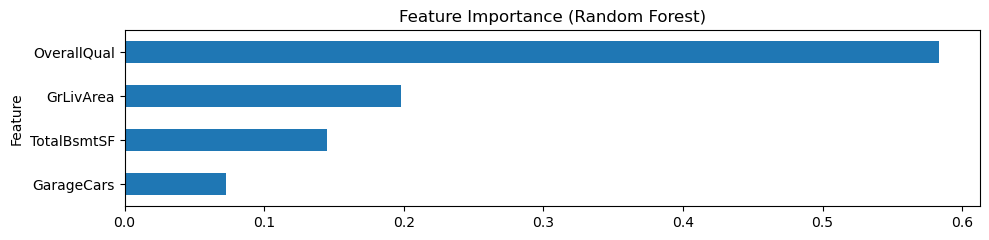

In [72]:
# Feature Importance (I believe it is useful)
importances = rf_model.feature_importances_
feature_names = X_train_scaled.columns
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\n Feature Importances:")
print(feature_importance_df)

# Plot
feature_importance_df.plot(kind='barh', 
                           x='Feature', 
                           y='Importance', 
                           legend=False, 
                           figsize=(10, 2.5), 
                           title="Feature Importance (Random Forest)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()
